μελετησα το notebook που μας δωσατε απο το εργαστηριο για το node classification (PyG_Node_Classification_Lab2.ipynb), αλλα προτιμησα να κανω μια δικη μου προσπαθεια απο την αρχη, και παραλληλα επαιρνα και καθοδηγηση κοιτωντας τον κωδικα του notebook για να χτισω το δικο μου notebook

Γενικα, οταν κανω κωδικες απο την αρχη με το δικο μου μοτιβο, μου ειναι πιο ευκολο να ολοκληρωσω τα ερωτηματα και τα tasks (διοτι το παω βημα-βημα εξ'αρχης), οποτε γι αυτο ξεκινησα απο την αρχη δικο μου κωδικα κοιτωντας παραλληλα το δικο σας notebook απο το εργαστηριο και δεν πηγα απλως να τροποποιησω το δωθεν notebook οπως μας λετε στην εκφωνηση.

Στη 1η εργασια δε το εκανα αυτο το μοτιβο, και εν τελει με δυσκολεψε παραπανω. Θα προσπαθησω να την ξαναστειλω βελτιωμενη στο τελος της εξεταστικης αν προλαβω να βρω λιγο χρονο.

# ***ΕΡΩΤΗΜΑ Α1***

γενικες βιβλιοθηκες εγκατασταση

In [ ]:
import torch
!pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(1)
torch.cuda.manual_seed(1)
torch.cuda.manual_seed_all(1)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 39.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 39.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 932.1/932.1 kB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.0/565.0 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import tensorflow as tf

# Check if GPU is available
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("No GPU available. Switch to GPU runtime in Colab.")

No GPU available. Switch to GPU runtime in Colab.


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import tensorflow as tf

# Check the available GPU devices
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Set memory growth to avoid allocating all GPU memory at once
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

    # Set the GPU device manually (optional)
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

    print('GPU activated and configured for maximum performance.')
else:
    print("No GPU available. Switch to GPU runtime in Colab.")


No GPU available. Switch to GPU runtime in Colab.


In [ ]:
# Install required packages.
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

# Helper function for visualization.
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def visualize(h, color):
    z = TSNE(n_components=2).fit_transform(h.detach().cpu().numpy())

    plt.figure(figsize=(10,10))
    plt.xticks([])
    plt.yticks([])

    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="Set2")
    plt.show()

2.1.0+cu121
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


κανω import το Facebook Page-Page dataset (που ειναι το ιδιο με το δοθεν dataset στο eclass)

In [ ]:
from torch_geometric.datasets import FacebookPagePage
dataset = FacebookPagePage(root=".")
data = dataset[0]

Processing...
Done!


πληροφοριες για το dataset

In [ ]:
print('Dataset: {dataset}')
print('-----------------------')
print('Number of graphs: {len(dataset)}')
print('Number of nodes: {data.x.shape[0]}')
print('Number of classes: {dataset.num_classes}')

print('\nGraph:')
print('------')
print('Edges are directed:'), print({data.is_directed()})
print('Graph has isolated nodes:'), print({data.has_isolated_nodes()})
print('Graph has loops:'), print({data.has_self_loops()})

Dataset: {dataset}
-----------------------
Number of graphs: {len(dataset)}
Number of nodes: {data.x.shape[0]}
Number of classes: {dataset.num_classes}

Graph:
------
Edges are directed:
{False}
Graph has isolated nodes:
{False}
Graph has loops:
{True}


(None, None)

Σε αντίθεση με το Cora dataset που δινεται στο notebook του eclass για το node classification (PyG_Node_Classification_Lab2.ipynb), το Facebook dataset δεν διαθέτει training masks, validation masks και test masks από πριν προκαθορισμενες.

Γι' αυτο δημιουργω τις μασκες αυτες με βαση οπως λεει στο **ΕΡΩΤΗΜΑ Α2**

In [ ]:
data.train_mask = range(1,12470)
data.val_mask = range(12471, 15471)
data.test_mask = range(15472, 22470)

Εναλλακτικά, το PyTorch Geometric προσφέρει μια συνάρτηση μετασχηματισμού για τον υπολογισμό τυχαίων μασκών όταν το dataset φορτώνεται:

In [ ]:
import torch_geometric.transforms as T

για τη μελετη του γραφηματος πριν κατασκευασω το GCN, κανω τα εξης:

<BarContainer object of 233 artists>

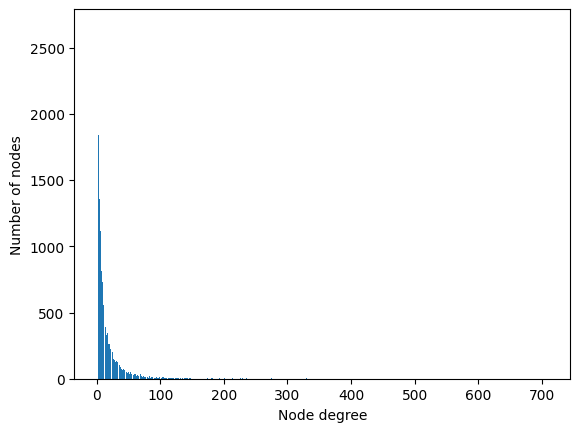

In [ ]:
from torch_geometric.datasets import Planetoid
from torch_geometric.utils import degree
from collections import Counter
import matplotlib.pyplot as plt

# Μια λιστα οπου αναφερεται ο βαθμος degree για καθε κομβο του γραφηματος (δλδ λεει το node degree για καθε κομβο)
degrees = degree(data.edge_index[0]).numpy()

# μετρηση του αριθμου των κομβων για καθε degree (βαθμο)
numbers = Counter(degrees)

# plot τα παραπανω
fig, ax = plt.subplots()
ax.set_xlabel('Node degree')
ax.set_ylabel('Number of nodes')
plt.bar(numbers.keys(), numbers.values())

In [ ]:
# Filter nodes with degree equal to 5
nodes_with_degree_5 = [node for node, degree in enumerate(degrees) if degree == 5]

# Print the nodes with degree equal to 5
print("Nodes with degree 5:", nodes_with_degree_5)


Nodes with degree 5: [25, 30, 40, 68, 82, 84, 89, 112, 116, 118, 125, 132, 144, 163, 170, 174, 175, 179, 181, 190, 195, 220, 231, 278, 286, 291, 352, 386, 401, 414, 489, 508, 553, 574, 577, 634, 665, 717, 791, 798, 814, 820, 836, 849, 851, 852, 857, 861, 869, 883, 931, 949, 963, 966, 993, 994, 1033, 1043, 1072, 1074, 1115, 1133, 1152, 1160, 1173, 1180, 1185, 1206, 1208, 1218, 1239, 1255, 1272, 1297, 1299, 1338, 1358, 1371, 1385, 1400, 1484, 1486, 1540, 1546, 1571, 1584, 1591, 1606, 1612, 1615, 1621, 1640, 1643, 1644, 1648, 1661, 1662, 1663, 1669, 1671, 1679, 1699, 1735, 1737, 1757, 1764, 1768, 1790, 1792, 1818, 1844, 1868, 1873, 1874, 1899, 1902, 1922, 1928, 1954, 1956, 1967, 1977, 2009, 2016, 2020, 2045, 2046, 2069, 2111, 2126, 2129, 2130, 2144, 2165, 2184, 2200, 2207, 2213, 2263, 2290, 2292, 2310, 2324, 2356, 2357, 2385, 2392, 2393, 2423, 2436, 2446, 2481, 2487, 2525, 2537, 2569, 2618, 2622, 2638, 2650, 2657, 2672, 2675, 2677, 2682, 2699, 2701, 2711, 2747, 2756, 2769, 2785, 2789, 279

In [ ]:

import networkx as nx

# Assuming 'data' is your graph data
G = nx.Graph()
G.add_edges_from(data.edge_index.t().numpy())

# Specify the starting node for BFS
start_node_0 = 0
start_node_1500 = 1500
start_node_22469 = 22469
start_node_18592 = 18592

# You can choose any node as the starting point
# Ελευθερη επιλογη του αρχικου κομβου για τον υπολογισμο της αποστασης γειτνιασης

# Find nodes at a distance of 5 from the starting node
nodes_at_distance_5_from_starting_node_0 = set(nx.single_source_shortest_path_length(G, start_node_0, cutoff=5).keys())

nodes_at_distance_5_from_starting_node_1500 = set(nx.single_source_shortest_path_length(G, start_node_1500, cutoff=5).keys())

nodes_at_distance_5_from_starting_node_22469 = set(nx.single_source_shortest_path_length(G, start_node_22469, cutoff=5).keys())

nodes_at_distance_5_from_starting_node_18592 = set(nx.single_source_shortest_path_length(G, start_node_18592, cutoff=5).keys())


# Generate pairs of nodes at a distance of 5
#pairs_at_distance_5 = [(source, target) for source in nodes_at_distance_5 for target in nodes_at_distance_5 if source != target]

# Print the pairs
#print("Node pairs with distance 5:", pairs_at_distance_5)

print(nodes_at_distance_5_from_starting_node_0)


print(nodes_at_distance_5_from_starting_node_1500)


print(nodes_at_distance_5_from_starting_node_22469)



print(nodes_at_distance_5_from_starting_node_18592)



{0, 1, 3, 4, 5, 6, 9, 10, 11, 13, 14, 18, 19, 23, 24, 25, 27, 28, 29, 30, 32, 36, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 55, 56, 57, 58, 59, 60, 61, 65, 66, 69, 70, 72, 73, 75, 77, 79, 81, 82, 83, 84, 85, 88, 90, 92, 93, 94, 96, 97, 98, 99, 101, 102, 106, 110, 111, 112, 113, 114, 119, 120, 123, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 138, 140, 141, 142, 144, 145, 148, 150, 151, 152, 154, 155, 157, 159, 162, 163, 167, 171, 172, 173, 178, 183, 185, 187, 188, 191, 193, 195, 197, 198, 199, 200, 201, 203, 205, 210, 212, 213, 214, 215, 218, 219, 221, 222, 223, 224, 226, 227, 228, 230, 231, 233, 234, 237, 238, 240, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 262, 264, 270, 277, 278, 279, 280, 281, 283, 285, 287, 288, 289, 290, 291, 293, 295, 296, 297, 298, 301, 302, 304, 305, 306, 307, 308, 312, 315, 317, 318, 319, 321, 323, 325, 326, 328, 329, 330, 333, 334, 337, 338, 339, 340, 343, 346, 347, 348, 349, 350, 351, 356, 358, 359, 360, 363, 364, 365, 36

In [ ]:
len(nodes_at_distance_5_from_starting_node_0)

12238

In [ ]:
len(nodes_at_distance_5_from_starting_node_1500)

20397

In [ ]:
len(nodes_at_distance_5_from_starting_node_22469)

11374

In [ ]:
len(nodes_at_distance_5_from_starting_node_18592)

16735

# ΕΡΩΤΗΜΑ Α2

Κανω import το PyTorch και το GCN layer (ειναι προ-υλοποιημενο) απ' το PyTorch Geometric

In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv


κατασκευη συναρτησης για τον υπολογισμο του accuracy score

In [ ]:
def accuracy(y_pred, y_true):
    return torch.sum(y_pred == y_true) / len(y_true)


Δημιουργω μια κλάση GCN με μια συνάρτηση __init_() που λαμβάνει τρεις παραμέτρους ως είσοδο: τον αριθμό των διαστάσεων εισόδου (dim_in) , τον αριθμό των hidden διαστάσεων (dim_h) και τον αριθμό των διαστάσεων εξόδου (dim_out)

 το συγκεκριμενο GCN εχει 2 layers. Αρα θεωρει γειτονια μηκους 2.
 Ετσι το στοιχειοθετει και στο ακολουθο notebook
 (https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=hjsb3Fst2P8k)
 στο ακολουθο σημειο που λεει:

------

 *"Here, we first initialize all of our building blocks in __init__ and define the computation flow of our network in forward. We first define and stack three graph convolution layers, which corresponds to aggregating 3-hop neighborhood information around each node (all nodes up to 3 "hops" away). In addition, the GCNConv layers reduce the node feature dimensionality to  2 , i.e.,  34→4→4→2 . Each GCNConv layer is enhanced by a tanh non-linearity.

After that, we apply a single linear transformation (torch.nn.Linear) that acts as a classifier to map our nodes to 1 out of the 4 classes/communities.

We return both the output of the final classifier as well as the final node embeddings produced by our GNN. We proceed to initialize our final model via GCN(), and printing our model produces a summary of all its used sub-modules."*

In [ ]:
class GCN(torch.nn.Module):
    def __init__(self, dim_in, dim_h, dim_out):
        super().__init__()
        self.gcn1 = GCNConv(dim_in, dim_h)
        self.gcn2 = GCNConv(dim_h, dim_out)


# Η forward method ομοιως έχει δύο επίπεδα GCN. Μια συνάρτηση softmax εφαρμόζεται στο output για classification
    def forward(self, x, edge_index):
        h = self.gcn1(x, edge_index)
        h = torch.relu(h)
        h = self.gcn2(h, edge_index)
        return F.log_softmax(h, dim=1)

# Η fit() είναι με τις ίδιες ακριβώς παραμέτρους για το Adam optimizer (ρυθμός εκμάθησης 0,1 και normalization L2 0,0005):
    def fit(self, data, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=0.01, weight_decay=5e-4)

        self.train()
        for epoch in range(epochs+1):
            optimizer.zero_grad()
            out = self(data.x, data.edge_index)
            loss = criterion(out[data.train_mask], data.y[data.train_mask])
            acc = accuracy(out[data.train_mask].argmax(dim=1), data.y[data.train_mask])
            loss.backward()
            optimizer.step()

            if epoch % 20 == 0:
                val_loss = criterion(out[data.val_mask], data.y[data.val_mask])
                val_acc = accuracy(out[data.val_mask].argmax(dim=1), data.y[data.val_mask])
                print(f'Epoch {epoch:>3} | Train Loss: {loss:.3f} | Train Acc:'
                      f' {acc*100:>5.2f}% | Val Loss: {val_loss:.2f} | '
                      f'Val Acc: {val_acc*100:.2f}%')

# υλοποιηση της test() method

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, data.edge_index)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc


αρχικοποιηση και εκπαιδευση του μοντέλου GCN για 100 epochs:



In [ ]:
# Train GCN
gcn = GCN(dataset.num_features, 16, dataset.num_classes)
print(gcn)
gcn.fit(data, epochs=100)
acc = gcn.test(data)
print(f'\nGCN test accuracy: {acc*100:.2f}%\n')

GCN(
  (gcn1): GCNConv(128, 16)
  (gcn2): GCNConv(16, 4)
)
Epoch   0 | Train Loss: 1.537 | Train Acc: 17.94% | Val Loss: 1.54 | Val Acc: 16.77%
Epoch  20 | Train Loss: 0.508 | Train Acc: 83.38% | Val Loss: 0.52 | Val Acc: 82.97%
Epoch  40 | Train Loss: 0.329 | Train Acc: 89.17% | Val Loss: 0.34 | Val Acc: 88.73%
Epoch  60 | Train Loss: 0.276 | Train Acc: 91.27% | Val Loss: 0.30 | Val Acc: 90.57%
Epoch  80 | Train Loss: 0.250 | Train Acc: 92.37% | Val Loss: 0.28 | Val Acc: 91.27%
Epoch 100 | Train Loss: 0.233 | Train Acc: 93.07% | Val Loss: 0.27 | Val Acc: 91.67%

GCN test accuracy: 91.65%



υπολογισμος των embeddings των nodes (αν υποθεσουμε οτι τα node embeddings ειναι το output του τελευταιου GCN layer)

In [ ]:
gcn.forward(data.x,data.edge_index)

tensor([[-1.5787e-01, -2.2398e+00, -3.5857e+00, -4.4358e+00],
        [-1.0363e+01, -5.0864e+00, -6.4502e-03, -8.4333e+00],
        [-1.8459e+01, -5.0067e-05, -9.9085e+00, -1.4737e+01],
        ...,
        [-8.7201e+00, -4.3403e+00, -1.6526e-02, -5.7464e+00],
        [-2.6354e+00, -7.2211e-01, -8.3347e-01, -4.8230e+00],
        [-7.1538e-01, -1.2231e+00, -1.5931e+00, -4.3128e+00]],
       grad_fn=<LogSoftmaxBackward0>)

In [ ]:
len(gcn.forward(data.x,data.edge_index))

22470

δικη μου προσθηκη κωδικα, για visualization ολων των node embeddings ολων των κομβων του γραφηματος του dataset

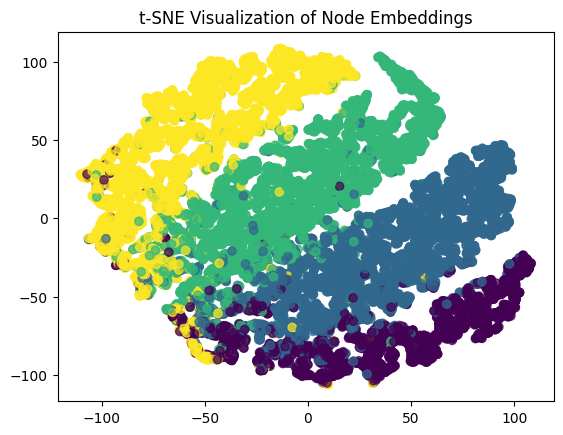

In [ ]:
# you may need to access the node embeddings differently, depending on the library or framework you are using for your graph neural network.

# Assuming you are using a popular library like PyTorch or TensorFlow, you might need to access the embeddings from the layers directly. Here's an example for PyTorch:

# This code assumes that the last layer of your GCN model directly produces node embeddings

import torch
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Assuming that gcn is an instance of your trained GCN model
# and data contains your graph data

# Set your model to evaluation mode
gcn.eval()

# Get node embeddings from the last layer of the GCN model
with torch.no_grad():
    node_embeddings = gcn(data.x, data.edge_index)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2)
node_embeddings_2d = tsne.fit_transform(node_embeddings.numpy())

# Visualize the 2D embeddings
plt.scatter(node_embeddings_2d[:, 0], node_embeddings_2d[:, 1], c=data.y, cmap='viridis', alpha=0.7)
plt.title('t-SNE Visualization of Node Embeddings')
plt.show()


In [ ]:
print(node_embeddings)

tensor([[-1.5787e-01, -2.2398e+00, -3.5857e+00, -4.4358e+00],
        [-1.0363e+01, -5.0864e+00, -6.4502e-03, -8.4333e+00],
        [-1.8459e+01, -5.0067e-05, -9.9085e+00, -1.4737e+01],
        ...,
        [-8.7201e+00, -4.3403e+00, -1.6526e-02, -5.7464e+00],
        [-2.6354e+00, -7.2211e-01, -8.3347e-01, -4.8230e+00],
        [-7.1538e-01, -1.2231e+00, -1.5931e+00, -4.3128e+00]])


# ΠΑΡΑΤΗΡΗΣΗ: ΤΑ NODE EMBEDDINGS ΠΟΥ ΠΑΡΑΓΟΝΤΑΙ ΑΠΟ ΤΗΝ ΕΞΟΔΟ ΤΟΥ gcn.forward(data.x,data.edge_index) ΚΑΙ ΑΠΟ ΤΗΝ ΕΞΟΔΟ ΤΟΥ node_embeddings = gcn(data.x, data.edge_index) ΕΙΝΑΙ ΤΟ ΙΔΙΟ

δικη μου προσθηκη κωδικα

εκτυπωση των node embeddings_2d ολων των κομβων του γραφηματος

In [ ]:
print("\n")
print(node_embeddings_2d)
print('------')
#print(node_embeddings_2d[0])



[[ -5.4986315 -95.394325 ]
 [ 37.724865   55.238434 ]
 [ 61.496258   26.727427 ]
 ...
 [ -3.8896437  41.568073 ]
 [-23.420586  -49.957607 ]
 [-24.571453  -57.907238 ]]
------
[ -5.4986315 -95.394325 ]


δικη μου προσθηκη κωδικα, για εκτυπωση των node embeddings των κομβων με αποσταση γειτνιασης = 5



εχοντας ως αρχικο κομβο τον node 0, παιρνω τη λιστα 'nodes_at_distance_5_from_starting_node_0' που περιεχει τους κομβους σε αποσταση 5 απο τον κομβο 0 (δλδ τους κομβους που απεχουν αποσταση = 5 απο τον αρχικο κομβο 0) και για καθε κομβο αυτης της λιστας υπολογιζω το node embedding του

In [ ]:
import tensorflow as tf

# κωδικας για ενεργοποιηση GPU για να μην αργουν παρα πολυ να τελειωσουν οι υπολογισμοι στους βροχους κλπ.
# Check the available GPU devices
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Set memory growth to avoid allocating all GPU memory at once
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

    # Set the GPU device manually (optional)
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

    print('GPU activated and configured for maximum performance.')
else:
    print("No GPU available. Switch to GPU runtime in Colab.")



print(nodes_at_distance_5_from_starting_node_0) # εκτυπωση των κομβων που εχουν αποσταση γειτνιασης = 5 απο τον αρχικο κομβο 0 (ως αρχικο κομβο μπορουμε να θεωρησουμε οποιον θελουμε εννοειται απο τους 22470 συνολικους κομβους του dataset)



# εδω εφτιαξα απλως ενα for loop που μου ηρθε σαν εναλλακτικη ιδεα , το οποιο υπολογιζει ως node embeddings τις τιμες εξοδου απο το τελευταιο layer του GCN (θεωρωντας οτι στην εξοδο απο το τελευταιο αυτο layer παραγονται τα node emdebbings)
count = 0 # μετρητης για το for lopp

for i in nodes_at_distance_5_from_starting_node_0:
    gcn.forward(data.x,data.edge_index)[i]
    print(gcn.forward(data.x,data.edge_index)[i])
    count = count + 1
    print('i=',i) # επιβεβαιωνει οτι ο δεικτης i τρεχει σωστα πανω στη λιστα nodes_at_distance_5_from_starting_node_0
    if i > 20: # εβαλα οριο 20 απλα για να δω οτι τρεχει σωστα. Κανονικα ο δεικτης i αν δε βαλω οριο θα φτασει τελικη τιμη οσο το len(nodes_at_distance_5_from_starting_node_0) που ειναι ισο με 12238
        break

print("\nsize of 'count' counter is:",count) # αν το μηκος του μετρητη count ειναι ισο με το μηκος του len(nodes_at_distance_5_from_starting_node_0), τοτε σημαινει οτι δουλευει σωστα το for loop

No GPU available. Switch to GPU runtime in Colab.
{0, 1, 3, 4, 5, 6, 9, 10, 11, 13, 14, 18, 19, 23, 24, 25, 27, 28, 29, 30, 32, 36, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 52, 54, 55, 56, 57, 58, 59, 60, 61, 65, 66, 69, 70, 72, 73, 75, 77, 79, 81, 82, 83, 84, 85, 88, 90, 92, 93, 94, 96, 97, 98, 99, 101, 102, 106, 110, 111, 112, 113, 114, 119, 120, 123, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 138, 140, 141, 142, 144, 145, 148, 150, 151, 152, 154, 155, 157, 159, 162, 163, 167, 171, 172, 173, 178, 183, 185, 187, 188, 191, 193, 195, 197, 198, 199, 200, 201, 203, 205, 210, 212, 213, 214, 215, 218, 219, 221, 222, 223, 224, 226, 227, 228, 230, 231, 233, 234, 237, 238, 240, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 262, 264, 270, 277, 278, 279, 280, 281, 283, 285, 287, 288, 289, 290, 291, 293, 295, 296, 297, 298, 301, 302, 304, 305, 306, 307, 308, 312, 315, 317, 318, 319, 321, 323, 325, 326, 328, 329, 330, 333, 334, 337, 338, 339, 340, 343, 346, 347, 348, 34

παρατηρω οτι το καθε node embedding που παραγεται απο το GCN (με βαση την ιδεα μου για το for loop) ειναι ενας μονοδιαστατος τανυστης που περιεχει 4 νουμερα (στοιχεια), οπου τοσες ειναι και οι κλασεις του dataset

διαλεγω ως node embeddings τα  στοιχεα της λιστας 'node_embeddings_2d' που ειναι δισδιαστατα στοιχεια (σε αντιθεση με τα στοιχεια της λιστας 'node_embeddings' που ειναι 4-διαστατα)

Ωστοσο, μπορω να κανω την ιδια ακριβως διαδικασια και για τα 4-διαστατα στοιχεια της λιστας 'node_embeddings'



# ΠΑΡΑΤΗΡΗΣΗ: ΤΑ NODE EMBEDDINGS ΠΟΥ ΠΑΡΑΓΟΝΤΑΙ ΑΠΟ ΤΗΝ ΕΞΟΔΟ ΤΟΥ gcn.forward(data.x,data.edge_index) ΚΑΙ ΑΠΟ ΤΗΝ ΕΞΟΔΟ ΤΟΥ node_embeddings = gcn(data.x, data.edge_index) ΕΙΝΑΙ ΤΟ ΙΔΙΟ

In [ ]:
list_of_node_embeddings_at_adjacency_distance_5_from_starting_node_0 = []
j=0
for j in nodes_at_distance_5_from_starting_node_0:
  print(j)
  print("-----")
  print(node_embeddings_2d[j])
  list_of_node_embeddings_at_adjacency_distance_5_from_starting_node_0.append(node_embeddings_2d[j])

Streaming output truncated to the last 5000 lines.
-----
[-86.96372  26.15205]
19412
-----
[-45.545033 -35.445133]
19413
-----
[  8.231225 -61.443405]
19415
-----
[14.271044 63.338078]
19416
-----
[-44.59912  88.71451]
19417
-----
[-12.227844 -25.247116]
19418
-----
[-46.81646  -17.659395]
19421
-----
[29.006304  -1.3249943]
19423
-----
[92.299995 13.806664]
19424
-----
[ 55.442085 -75.79292 ]
19428
-----
[85.44027    4.5289974]
19430
-----
[31.95269  -8.425501]
19432
-----
[49.54125 84.41847]
19434
-----
[27.107687  -2.4161465]
19436
-----
[ 3.6044362 14.691765 ]
19437
-----
[-14.047373 -19.13184 ]
19438
-----
[23.096512 26.264751]
19440
-----
[-79.51051  -25.393322]
19441
-----
[-45.736958  77.76734 ]
19444
-----
[75.09819  20.380474]
19447
-----
[89.227066 18.645227]
19448
-----
[21.409567 71.00108 ]
19453
-----
[ 20.505606 -19.784794]
19455
-----
[16.019712  15.0019045]
19456
-----
[ 98.7969   -33.203884]
19457
-----
[-32.69591   52.998306]
19458
-----
[-31.775555  32.00866 ]
19461

In [ ]:
# εκτυπωση της λιστας 'list_of_node_embeddings_at_adjacency_distance_5_from_starting_node_0'
list_of_node_embeddings_at_adjacency_distance_5_from_starting_node_0

[array([ -5.4986315, -95.394325 ], dtype=float32),
 array([37.724865, 55.238434], dtype=float32),
 array([-49.756947, -49.11064 ], dtype=float32),
 array([-87.25624 ,   6.614098], dtype=float32),
 array([-30.498453,  73.11288 ], dtype=float32),
 array([-18.004406, 100.78066 ], dtype=float32),
 array([-32.569153, -30.242292], dtype=float32),
 array([-38.00396 , -31.519129], dtype=float32),
 array([-78.689   ,  21.426348], dtype=float32),
 array([-33.46535,  19.22297], dtype=float32),
 array([63.87491 , 67.123146], dtype=float32),
 array([54.631325, 45.581455], dtype=float32),
 array([  4.740243, -56.26912 ], dtype=float32),
 array([-12.006459, -61.349316], dtype=float32),
 array([  6.7466645, -42.924736 ], dtype=float32),
 array([ 29.507452, -77.17906 ], dtype=float32),
 array([ 40.43757 , -49.367863], dtype=float32),
 array([  1.3573449, -56.785553 ], dtype=float32),
 array([52.405422, 14.33455 ], dtype=float32),
 array([  7.0910435, -79.83747  ], dtype=float32),
 array([22.084461, 40.

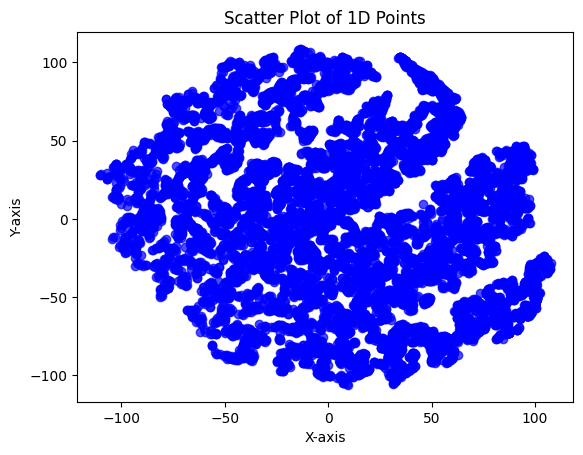

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'array_list' (που ειναι πιο πανω δηλωμενη) contains your large list of 1D arrays

# Convert the list of arrays to a NumPy array
points = np.array(array_list)

# Extract x and y coordinates using array slicing
x_values = points[:, 0]
y_values = points[:, 1]

# Create a scatter plot
plt.scatter(x_values, y_values, marker='o', color='blue', alpha=0.7)  # Adjust alpha for transparency
plt.title('Scatter Plot of 1D Points')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.show()


# ΕΡΩΤΗΜΑ Α3

# ***1ος τροπος***

για να βρω ποιοι ειναι οι 5 πιθανοτεροι φιλοι για τον κομβο 1, θα θεωρησω αυτους τους 5 κομβους που ειναι πιο κοντα (σε ευκλειδια αποσταση) απο τον κομβο 1

Αλλιως, μπορω να πω οτι οι 5 πιθανοτεροι φιλοι ειναι αυτοι που εχουν πιο κοντινη τιμη (μετρο, δλδ απολυτη τιμη) node embedding με τον κομβο 1

ως node embeddings θα παρω αυτα της λιστας 'node_embeddings_2d'

In [ ]:
import numpy as np

l2_norm_of_node_embeddings_list = []

# Calculate the L2 norm of every node embedding in the node_embeddings_2d list
k=0
for k in node_embeddings_2d:
    l2_norm_of_node_embeddings_list.append(np.linalg.norm(k))

# Print the calculated L2 norms
for i, norm in enumerate(l2_norm_of_node_embeddings_list):
    print(f"L2 Norm of node {i + 1}: {norm}")

print(l2_norm_of_node_embeddings_list)


Streaming output truncated to the last 5000 lines.
L2 Norm of node 17472: 60.11769104003906
L2 Norm of node 17473: 79.26879119873047
L2 Norm of node 17474: 84.28624725341797
L2 Norm of node 17475: 57.803958892822266
L2 Norm of node 17476: 97.7580795288086
L2 Norm of node 17477: 104.74073028564453
L2 Norm of node 17478: 98.45722198486328
L2 Norm of node 17479: 71.43045806884766
L2 Norm of node 17480: 60.58242416381836
L2 Norm of node 17481: 56.128631591796875
L2 Norm of node 17482: 24.214309692382812
L2 Norm of node 17483: 59.03466033935547
L2 Norm of node 17484: 23.41873550415039
L2 Norm of node 17485: 67.08976745605469
L2 Norm of node 17486: 108.56871032714844
L2 Norm of node 17487: 59.68088912963867
L2 Norm of node 17488: 110.57621765136719
L2 Norm of node 17489: 70.4263916015625
L2 Norm of node 17490: 41.49845886230469
L2 Norm of node 17491: 111.45219421386719
L2 Norm of node 17492: 93.83139038085938
L2 Norm of node 17493: 86.1821517944336
L2 Norm of node 17494: 51.3988037109375
L2 

ταξινομηση της l2_norm_of_node_embeddings_list σε φθινουσα σειρα, ωστε να βρω τους 5 κοντινοτερους φιλους του κομβου 1

In [ ]:
sorted_l2_norm_of_node_embeddings_list = sorted(l2_norm_of_node_embeddings_list,reverse=True)
print(sorted_l2_norm_of_node_embeddings_list)

[116.50331, 115.76247, 115.69488, 115.6723, 115.66197, 115.553825, 115.541954, 115.49017, 115.39478, 115.39363, 115.389984, 115.389984, 115.3877, 115.32537, 115.32537, 115.31709, 115.28568, 115.270065, 115.26908, 115.247734, 115.2208, 115.20838, 115.18492, 115.1304, 115.12268, 115.04068, 115.027466, 114.7681, 114.76425, 114.7056, 114.7056, 114.7056, 114.64275, 114.64275, 114.64275, 114.64186, 114.641815, 114.64039, 114.61378, 114.51289, 114.48956, 114.307304, 114.2896, 114.09102, 114.031845, 114.00659, 113.978004, 113.91781, 113.874115, 113.8741, 113.8741, 113.8741, 113.87404, 113.87404, 113.87401, 113.85234, 113.84176, 113.841385, 113.84129, 113.84129, 113.84081, 113.84069, 113.84065, 113.83301, 113.81862, 113.81861, 113.81714, 113.80063, 113.792046, 113.792046, 113.792046, 113.79204, 113.79203, 113.791985, 113.79191, 113.787834, 113.786575, 113.75602, 113.69942, 113.66918, 113.64642, 113.6408, 113.615036, 113.48669, 113.47877, 113.44746, 113.44741, 113.44734, 113.447334, 113.447334, 

list

η L2-νορμα του node embedding του κομβου 1

In [ ]:
print(l2_norm_of_node_embeddings_list[1])

66.891335


αρα , διαπιστωνω οτι ο κομβος 1 (l2-norm = 66,891335) εχει ως 5 πιθανοτερους φιλους (δλδ κομβους με πιο κοντινη (κατα μετρο) τιμη node embedding ως προς στον κομβο 1) ειναι οι κομβοι με τιμες l2-norm value of node embedding = {66,901184 , 66,893555, 66,888885, 66,88803, 66,88293}

οι 5 κοντινοτεροι γειτονες του κομβου 1 ειναι οι εξης κομβοι:

In [ ]:
# Number to find
neighbor_1 = 66.901184
neighbor_2 = 115.69488
neighbor_3 = 115.6723
neighbor_4 = 115.66197
neighbor_5 = 115.553825


# στην αρχη εγραψα τον εξης κωδικα για να βρω τη θεση του κομβου στην αρχικη λιστα των l2-norms των node embeddings:

'''
# Find the index of the target number
position_neighbor_1 = l2_norm_of_node_embeddings_list.index(neighbor_1)
position_neighbor_2 = l2_norm_of_node_embeddings_list.index(neighbor_2)
position_neighbor_3 = l2_norm_of_node_embeddings_list.index(neighbor_3)
position_neighbor_4 = l2_norm_of_node_embeddings_list.index(neighbor_4)
position_neighbor_5 = l2_norm_of_node_embeddings_list.index(neighbor_5)

print(f"The position of neighbor_1 in the list is: {position_neighbor_1}")
print(f"The position of neighbor_2 in the list is: {position_neighbor_2}")
print(f"The position of neighbor_3 in the list is: {position_neighbor_3}")
print(f"The position of neighbor_4 in the list is: {position_neighbor_4}")
print(f"The position of neighbor_5 in the list is: {position_neighbor_5}")
'''

# αλλα εβγαλε σφαλμα οτι δεν εβρισκε τους αριθμους στη λιστα 'l2_norm_of_node_embeddings_list' (ενω οντως υπηρχαν μεσα στη λιστα, αποδεικνυεται και με το ματι)
# γι' αυτο, εβαλα precision/ακριβεια 4 δεκαδικων ψηφιων, ωστε να λυθει το προβλημα του μη-εντοπισμου





tolerance = 1e-4

found = False
position = None


# η θεση του neighbor_1 , δλδ ποιος ειναι ο κομβος αυτος


print('-----------------------------------------')


for i, num in enumerate(l2_norm_of_node_embeddings_list):
    if abs(num - neighbor_1) < tolerance:
        found = True
        position = i
        break

if found:
    print(f"The position of neighbor_1 = {neighbor_1} in the list is: {position}")
else:
    print(f"neighbor_1={neighbor_1} is not in the list.")


print('-----------------------------------------')


# η θεση του neighbor_2 , δλδ ποιος ειναι ο κομβος αυτος


for i, num in enumerate(l2_norm_of_node_embeddings_list):
    if abs(num - neighbor_2) < tolerance:
        found = True
        position = i
        break

if found:
    print(f"The position of neighbor_2 = {neighbor_2} in the list is: {position}")
else:
    print(f"neighbor_2={neighbor_2} is not in the list.")



print('-----------------------------------------')


# η θεση του neighbor_3 , δλδ ποιος ειναι ο κομβος αυτος


for i, num in enumerate(l2_norm_of_node_embeddings_list):
    if abs(num - neighbor_3) < tolerance:
        found = True
        position = i
        break

if found:
    print(f"The position of neighbor_3 = {neighbor_3} in the list is: {position}")
else:
    print(f"neighbor_3={neighbor_3} is not in the list.")



print('-----------------------------------------')


# η θεση του neighbor_4 , δλδ ποιος ειναι ο κομβος αυτος


for i, num in enumerate(l2_norm_of_node_embeddings_list):
    if abs(num - neighbor_4) < tolerance:
        found = True
        position = i
        break

if found:
    print(f"The position of neighbor_4 = {neighbor_4} in the list is: {position}")
else:
    print(f"neighbor_4={neighbor_4} is not in the list.")


print('-----------------------------------------')


# η θεση του neighbor_5 , δλδ ποιος ειναι ο κομβος αυτος


for i, num in enumerate(l2_norm_of_node_embeddings_list):
    if abs(num - neighbor_5) < tolerance:
        found = True
        position = i
        break

if found:
    print(f"The position of neighbor_5 = {neighbor_5} in the list is: {position}")
else:
    print(f"neighbor_5 = {neighbor_5} is not in the list.")




-----------------------------------------
The position of neighbor_1 = 66.901184 in the list is: 20603
-----------------------------------------
The position of neighbor_2 = 115.69488 in the list is: 2211
-----------------------------------------
The position of neighbor_3 = 115.6723 in the list is: 4210
-----------------------------------------
The position of neighbor_4 = 115.66197 in the list is: 2700
-----------------------------------------
The position of neighbor_5 = 115.553825 in the list is: 20447


# ***2ος τροπος***

υλοποιηση του GCN με 5 layers για αποσταση γειτονιας = 5, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

In [ ]:
# Install required packages.
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

# Helper function for visualization.
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt


def visualize_graph(G, color):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), with_labels=False,
                     node_color=color, cmap="Set2")
    plt.show()


def visualize_embedding(h, color, epoch=None, loss=None):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    h = h.detach().cpu().numpy()
    plt.scatter(h[:, 0], h[:, 1], s=140, c=color, cmap="Set2")
    if epoch is not None and loss is not None:
        plt.xlabel(f'Epoch: {epoch}, Loss: {loss.item():.4f}', fontsize=16)
    plt.show()

2.1.0+cu121
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 4)
  (conv4): GCNConv(4, 4)
  (conv5): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

Epoch: 0, Loss: 1.4137412309646606, Accuracy: 0.39211203200914546


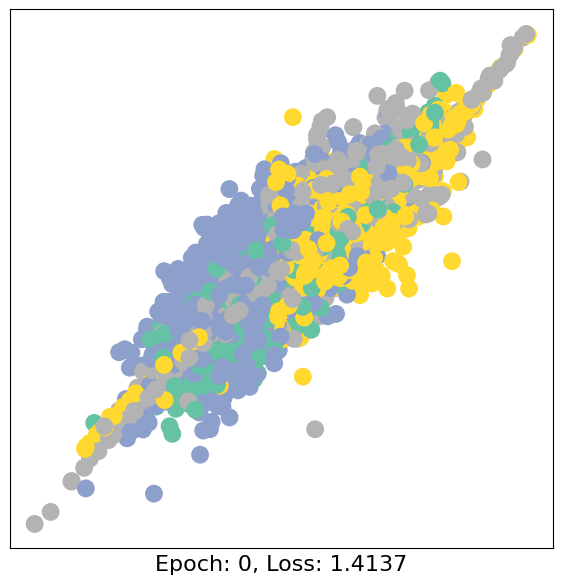

Epoch: 10, Loss: 1.1415570974349976, Accuracy: 0.579879965704487


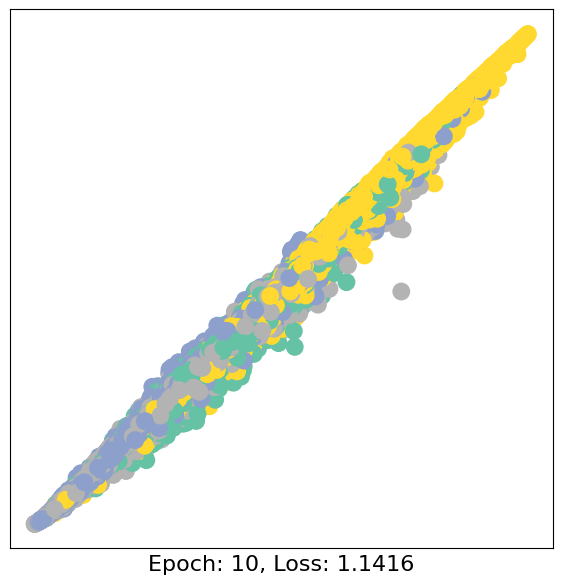

Epoch: 20, Loss: 1.0033361911773682, Accuracy: 0.5583023721063161


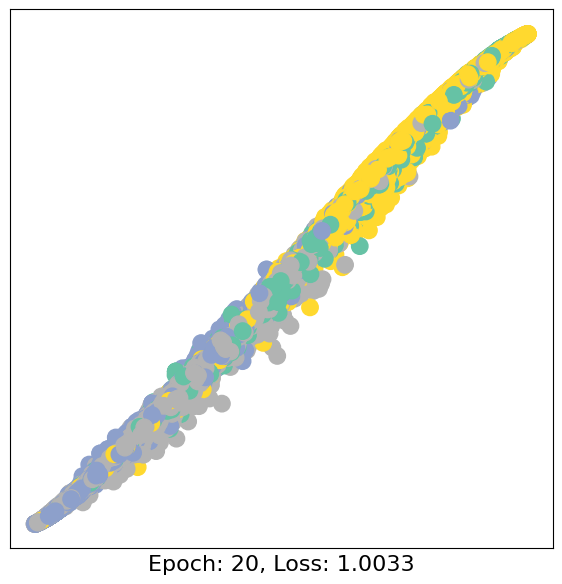

Epoch: 30, Loss: 0.9510519504547119, Accuracy: 0.559874249785653


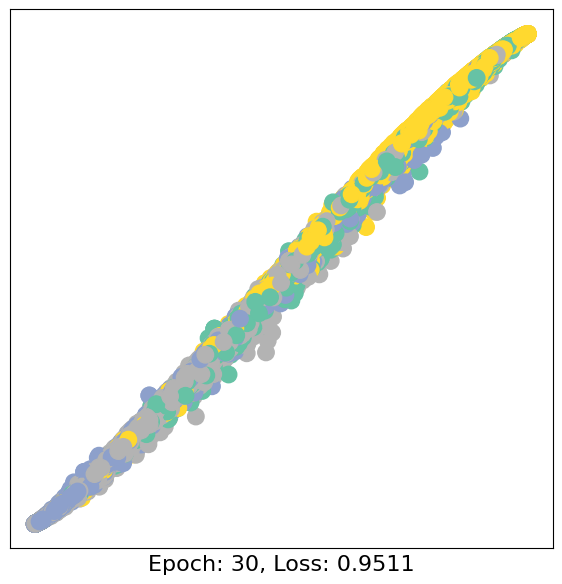

Epoch: 40, Loss: 0.9183161854743958, Accuracy: 0.5664475564446985


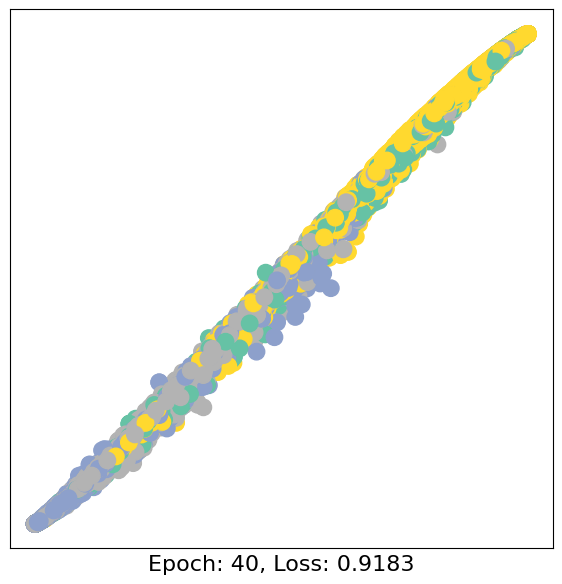

Epoch: 50, Loss: 0.8960518836975098, Accuracy: 0.5838811088882538


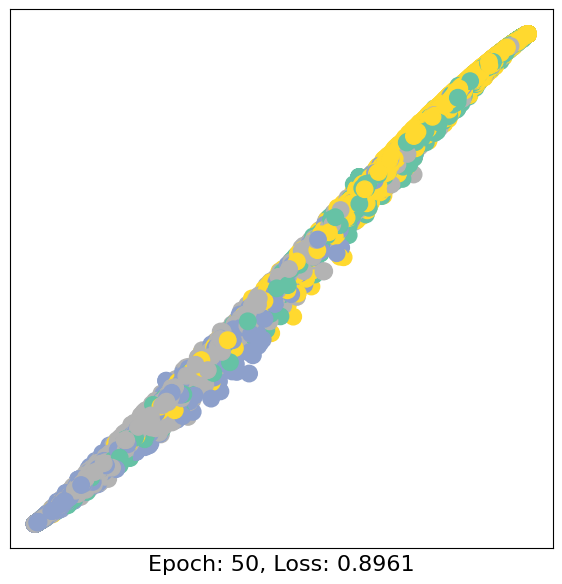

Epoch: 60, Loss: 0.8809862732887268, Accuracy: 0.5813089454129752


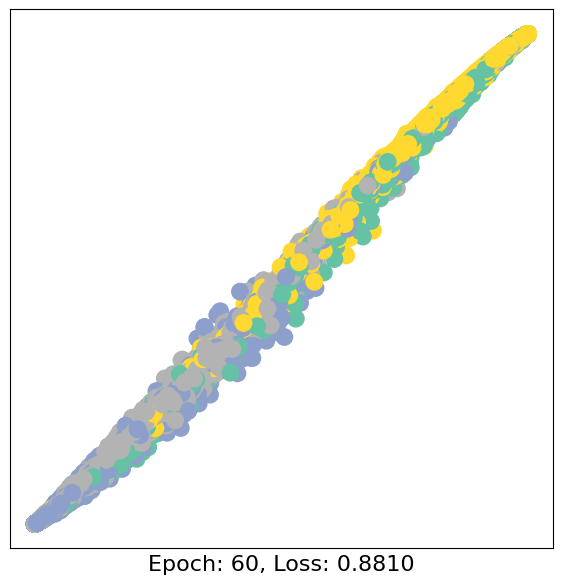

Epoch: 70, Loss: 0.8666688203811646, Accuracy: 0.580594455558731


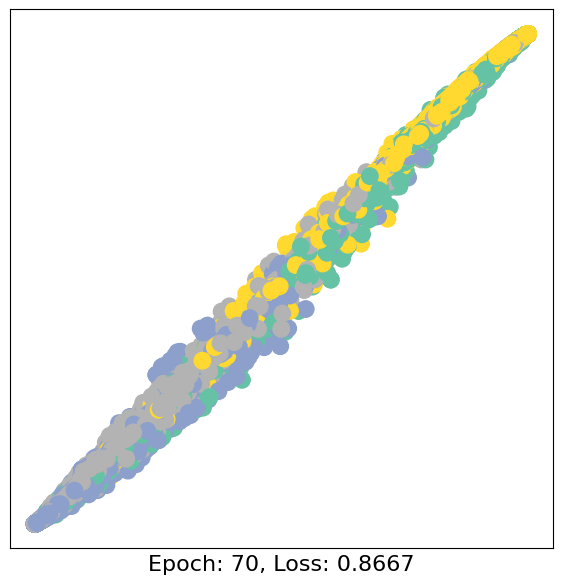

Epoch: 80, Loss: 0.8568152785301208, Accuracy: 0.5881680480137182


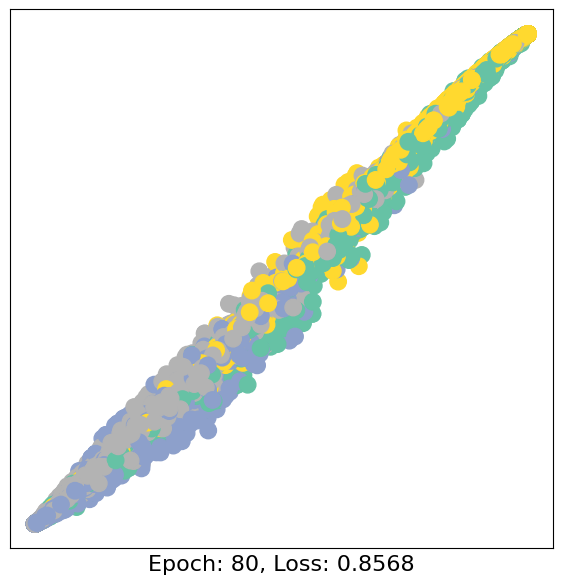

Epoch: 90, Loss: 0.8495563268661499, Accuracy: 0.5928836810517291


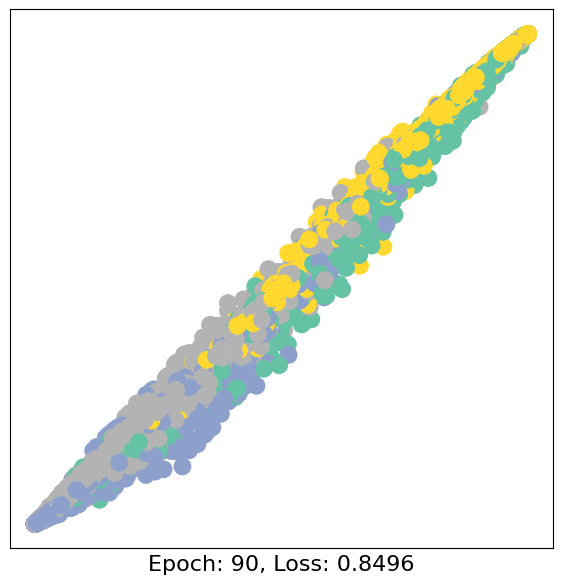

'\nfor epoch in range(100):\n    loss, h = train(data)\n    if epoch % 10 == 0:\n        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)\n        time.sleep(0.3)\n'

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 4)
        self.conv3 = GCNConv(4, 4)
        self.conv4 = GCNConv(4, 4)
        self.conv5 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()
        h = self.conv3(h, edge_index)
        h = h.tanh()
        h = self.conv4(h, edge_index)
        h = h.tanh()
        h = self.conv5(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

from sklearn.metrics import accuracy_score

def test(data):
    model.eval()  # Set model to evaluation mode.
    with torch.no_grad():
        logits, _ = model(data.x, data.edge_index)
        pred = logits.argmax(dim=1)
        acc = accuracy_score(data.y[data.test_mask].cpu().numpy(), pred[data.test_mask].cpu().numpy())
    return acc

# Assuming you have defined data and visualize_embedding function

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        acc = test(data)
        print(f'Epoch: {epoch}, Loss: {loss.item()}, Accuracy: {acc}')
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)

'''
for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''

εκτυπωση των node embeddings (2-διαστατο για καθε κομβο)για αποσταση γειτονιας = 5

In [ ]:
print(h)

tensor([[ 0.7937,  0.8158],
        [ 0.9139,  0.9354],
        [-0.9916, -0.9955],
        ...,
        [ 0.9117,  0.9264],
        [-0.9670, -0.9769],
        [ 0.4749,  0.4921]], grad_fn=<TanhBackward0>)


το embedding για τον κομβο 1

In [ ]:
print(h[1])

tensor([0.9139, 0.9354], grad_fn=<SelectBackward0>)


οι 5 κοντινοτεροι φιλοι του κομβου 1

(Υπολογίζω την ευκλείδεια απόσταση μεταξύ της πρώτης ενσωμάτωσης και όλων των άλλων ενσωματώσεων, τις ταξινομω και επιλέγω τις 5 πλησιέστερες ενσωματώσεις εκτός από την πρώτη. Τέλος, εκτυπώνω τις 5 πλησιέστερες ενσωματώσεις.)

In [ ]:
import torch

# Your tensor data
data = h

# Embedding number 1
embedding_1 = data[0]

# Calculate Euclidean distances from embedding_1 to all other embeddings
distances = torch.norm(data - embedding_1, dim=1)

# Sort indices based on distances
sorted_indices = torch.argsort(distances)

# Get the indices of the 5 closest embeddings (excluding the first one)
closest_indices = sorted_indices[1:6]

# Get the closest embeddings
closest_embeddings = data[closest_indices]

print("Closest embeddings to embedding 1:")
print(closest_embeddings)


Closest embeddings to embedding 1:
tensor([[0.7928, 0.8156],
        [0.7920, 0.8168],
        [0.7957, 0.8160],
        [0.7956, 0.8145],
        [0.7959, 0.8168]], grad_fn=<IndexBackward0>)


# ΕΡΩΤΗΜΑ Β1

In [ ]:
# Find nodes at a distance of 10 from the starting node
nodes_at_distance_10_from_starting_node_0 = set(nx.single_source_shortest_path_length(G, start_node_0, cutoff=10).keys())

In [ ]:
print(nodes_at_distance_10_from_starting_node_0)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

διαλεγω ως node embeddings τα στοιχεα της λιστας 'node_embeddings_2d' που ειναι δισδιαστατα στοιχεια (σε αντιθεση με τα στοιχεια της λιστας 'node_embeddings' που ειναι 4-διαστατα), μονο και μονο για να ειναι λιγο πιο συντομοι οι υπολογισμοι των L2-norms των node embeddings

Ωστοσο, μπορω να κανω την ιδια ακριβως διαδικασια και για τα 4-διαστατα στοιχεια της λιστας 'node_embeddings' με την ιδια ακριβως μεθοδολογια.

In [ ]:
print(node_embeddings_2d)
print('------')


# print(node_embeddings)
# print('------')


[[ -5.4986315 -95.394325 ]
 [ 37.724865   55.238434 ]
 [ 61.496258   26.727427 ]
 ...
 [ -3.8896437  41.568073 ]
 [-23.420586  -49.957607 ]
 [-24.571453  -57.907238 ]]
------


----------------------------------------------

---------------------------------------------

---------------------------------------------

----------------------------------------------------------------------

------------------------------------------------------------------------------

# **ΕΡΩΤΗΜΑ Α2 - ΕΠΑΝΑΛΗΨΗ ΜΕ ΑΛΛΟΝ ΤΡΟΠΟ ΕΠΙΛΥΣΗΣ**

In [ ]:
# Install required packages.
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

# Helper function for visualization.
%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt


def visualize_graph(G, color):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), with_labels=False,
                     node_color=color, cmap="Set2")
    plt.show()


def visualize_embedding(h, color, epoch=None, loss=None):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])
    h = h.detach().cpu().numpy()
    plt.scatter(h[:, 0], h[:, 1], s=140, c=color, cmap="Set2")
    if epoch is not None and loss is not None:
        plt.xlabel(f'Epoch: {epoch}, Loss: {loss.item():.4f}', fontsize=16)
    plt.show()

2.1.0+cu121
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


υλοποιηση του GCN με 2 layers για αποσταση γειτονιας = 2, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

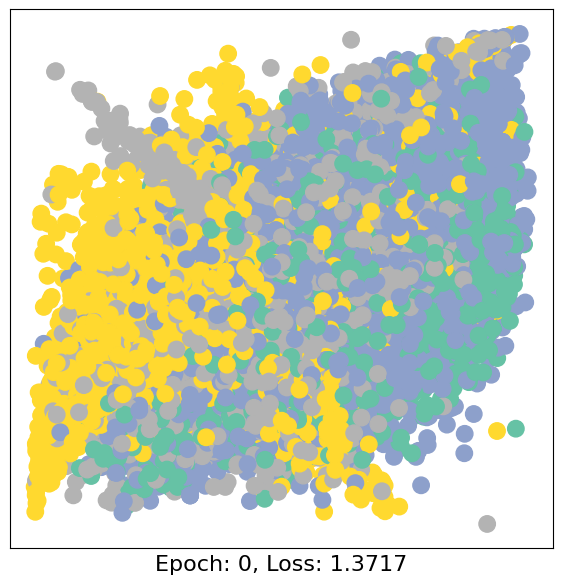

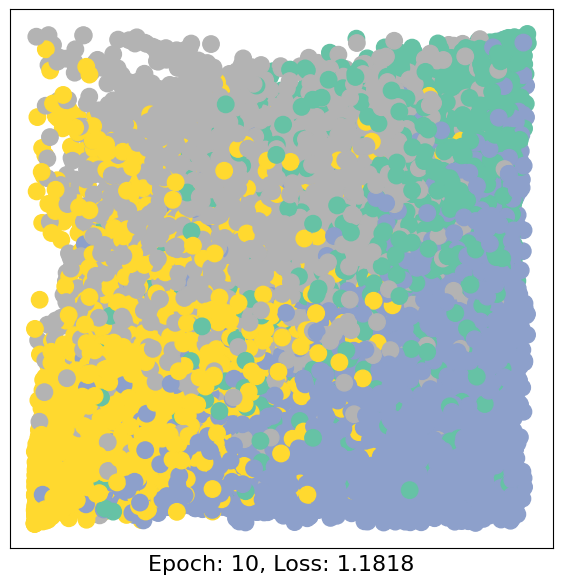

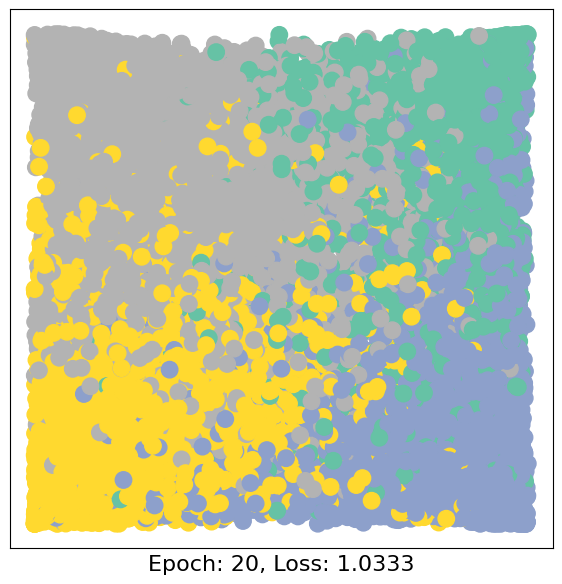

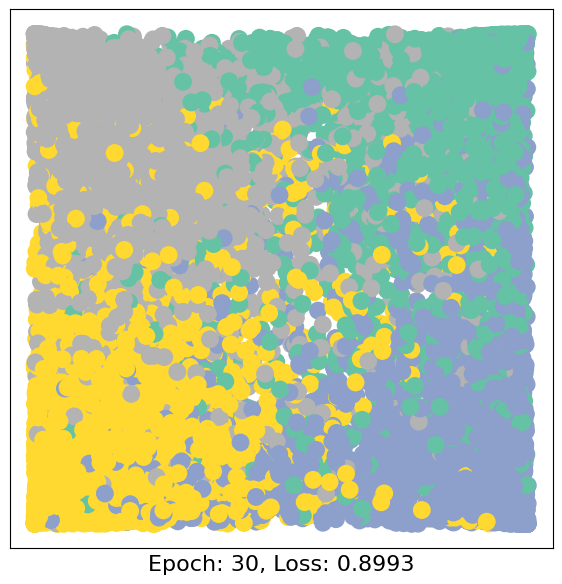

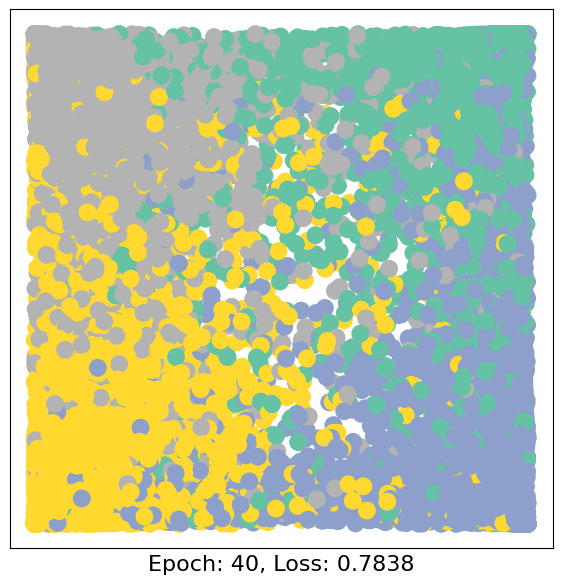

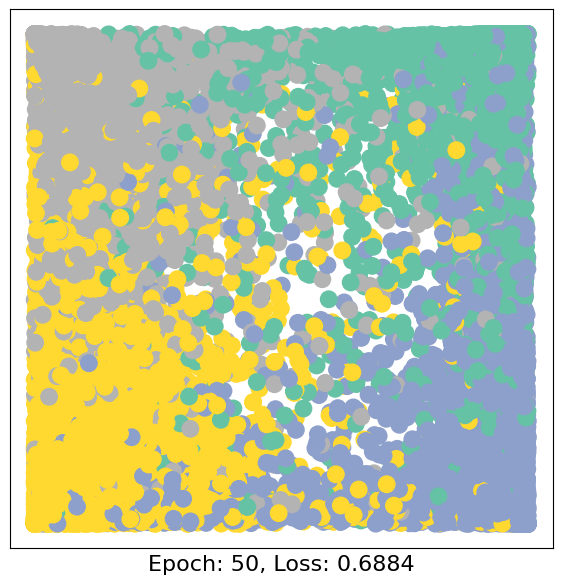

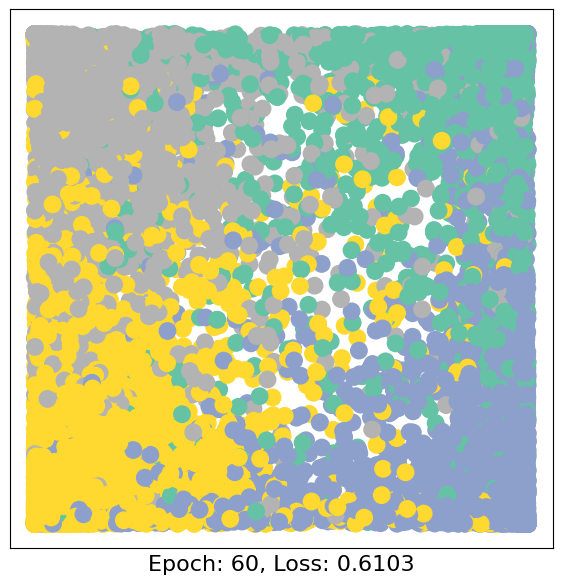

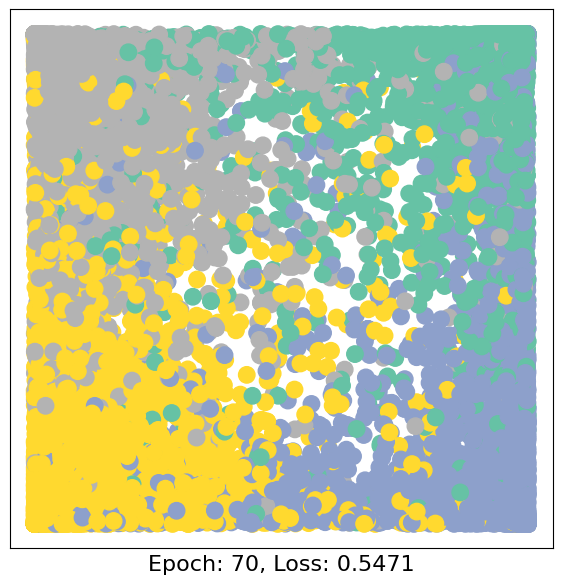

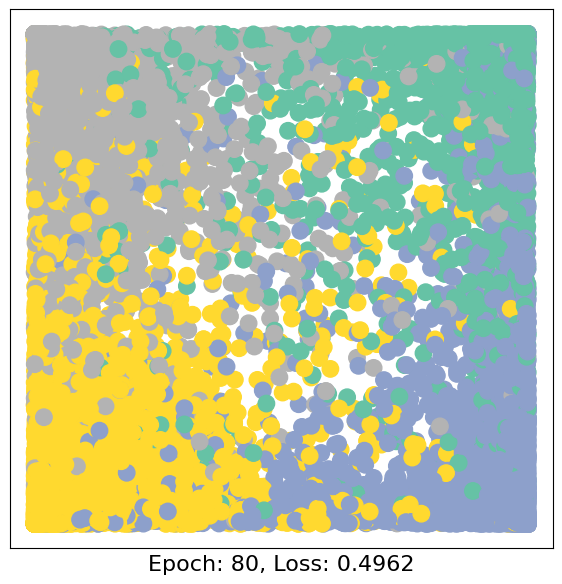

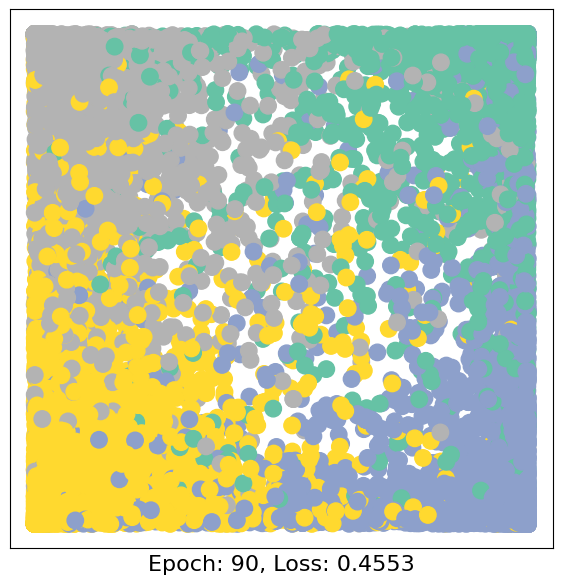

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)

υλοποιηση του GCN με 5 layers για αποσταση γειτονιας = 5, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 4)
  (conv4): GCNConv(4, 4)
  (conv5): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

Epoch: 0, Loss: 1.4137412309646606, Accuracy: 0.39211203200914546


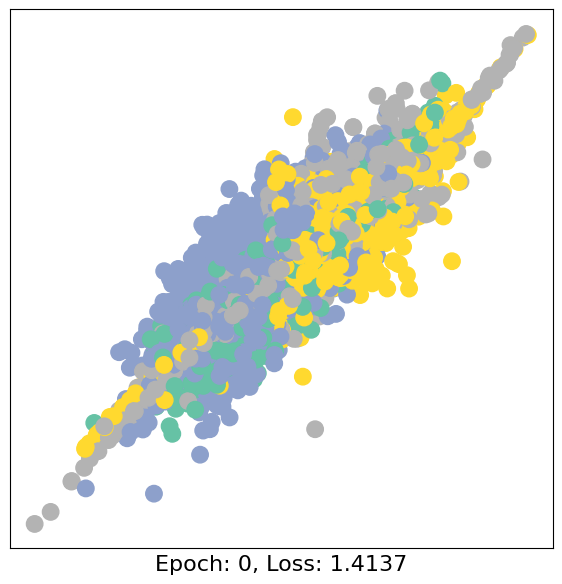

Epoch: 10, Loss: 1.1415570974349976, Accuracy: 0.579879965704487


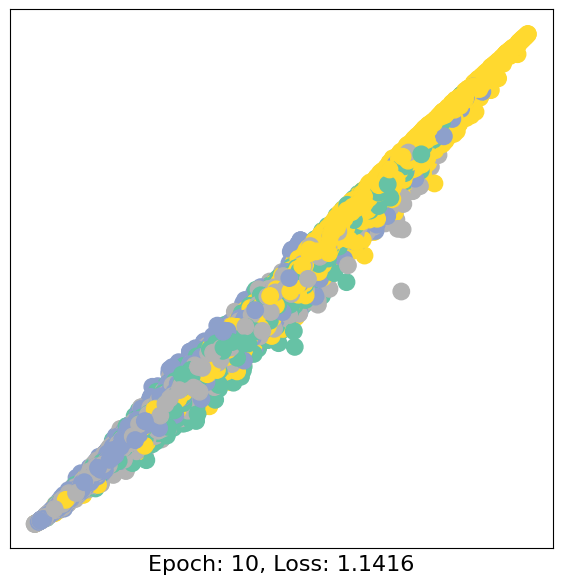

Epoch: 20, Loss: 1.0033363103866577, Accuracy: 0.5583023721063161


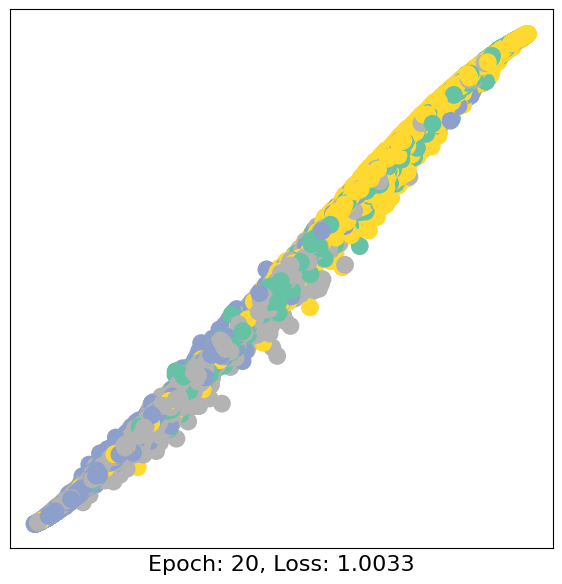

Epoch: 30, Loss: 0.9510519504547119, Accuracy: 0.559874249785653


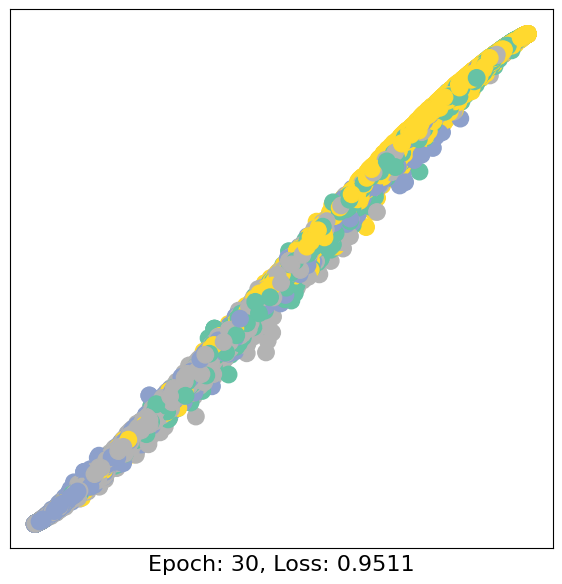

Epoch: 40, Loss: 0.9183160662651062, Accuracy: 0.5664475564446985


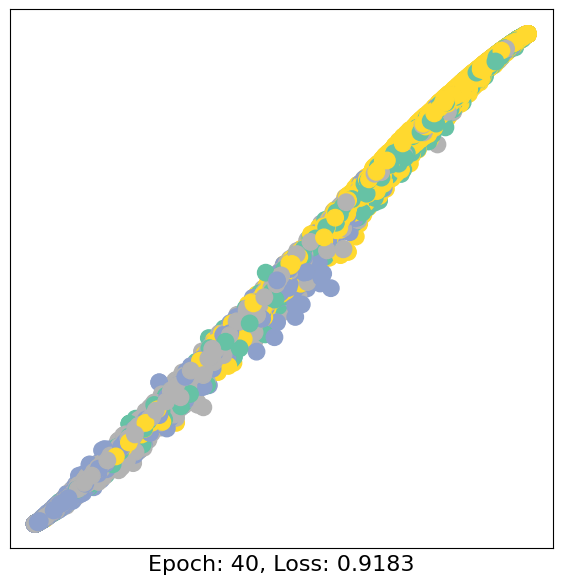

Epoch: 50, Loss: 0.896051824092865, Accuracy: 0.5838811088882538


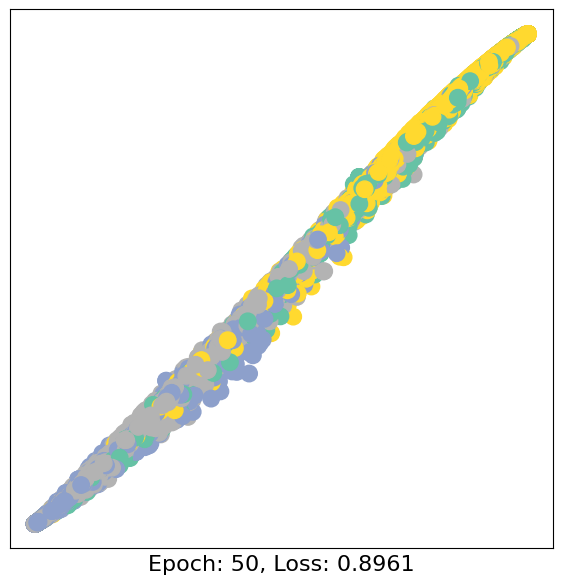

Epoch: 60, Loss: 0.8809862732887268, Accuracy: 0.5813089454129752


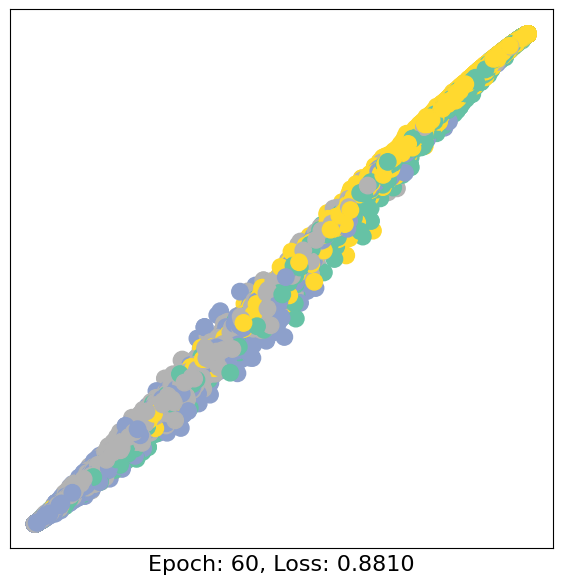

Epoch: 70, Loss: 0.866668701171875, Accuracy: 0.580594455558731


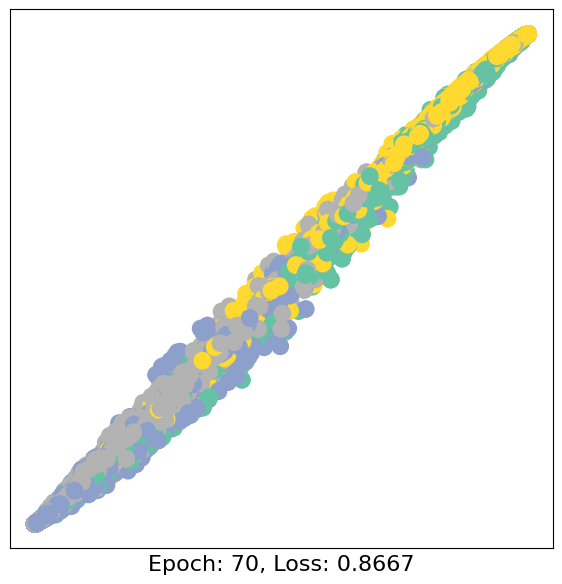

Epoch: 80, Loss: 0.8568152785301208, Accuracy: 0.5881680480137182


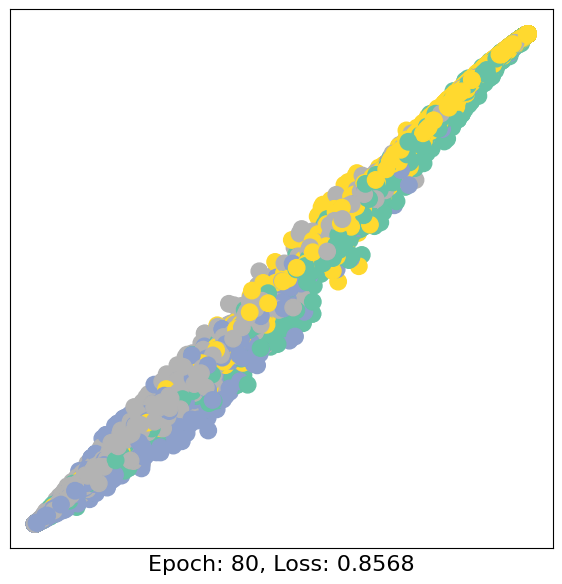

Epoch: 90, Loss: 0.8495562672615051, Accuracy: 0.5928836810517291


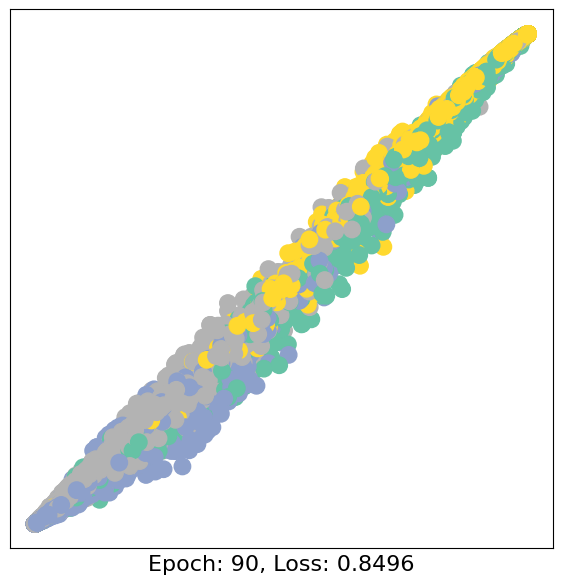

'\nfor epoch in range(100):\n    loss, h = train(data)\n    if epoch % 10 == 0:\n        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)\n        time.sleep(0.3)\n'

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 4)
        self.conv3 = GCNConv(4, 4)
        self.conv4 = GCNConv(4, 4)
        self.conv5 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()
        h = self.conv3(h, edge_index)
        h = h.tanh()
        h = self.conv4(h, edge_index)
        h = h.tanh()
        h = self.conv5(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

from sklearn.metrics import accuracy_score

def test(data):
    model.eval()  # Set model to evaluation mode.
    with torch.no_grad():
        logits, _ = model(data.x, data.edge_index)
        pred = logits.argmax(dim=1)
        acc = accuracy_score(data.y[data.test_mask].cpu().numpy(), pred[data.test_mask].cpu().numpy())
    return acc

# Assuming you have defined data and visualize_embedding function

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        acc = test(data)
        print(f'Epoch: {epoch}, Loss: {loss.item()}, Accuracy: {acc}')
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)

'''
for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''

In [ ]:
print(h)

tensor([[ 0.7937,  0.8158],
        [ 0.9139,  0.9354],
        [-0.9916, -0.9955],
        ...,
        [ 0.9117,  0.9264],
        [-0.9670, -0.9769],
        [ 0.4749,  0.4921]], grad_fn=<TanhBackward0>)


εκτυπωση των node embeddings (2-διαστατο για καθε κομβο)για αποσταση γειτονιας = 5

και αντιστοιχα οπως εκανα πιο πανω στην 1η προσπαθεια για το ερωτημα Α2, ετσι κι εδω μπορω να υπολογισω τους 5 κοντινοτερους φιλους του node 1 με α) ειτε κανοντας υπολογισμο της l2-norm των node embeddings, και βρισκοντας τις 5 πιο κοντινες ως προς την l2-norm του κομβου 1 ειτε με β) τον τροπο που εκανα στο ερωτημα Α3 2ος τροπος

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# ***Ερωτημα Β1***

υλοποιηση του GCN με 10 layers για αποσταση γειτονιας = 10, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 4)
  (conv4): GCNConv(4, 4)
  (conv5): GCNConv(4, 4)
  (conv6): GCNConv(4, 4)
  (conv7): GCNConv(4, 4)
  (conv8): GCNConv(4, 4)
  (conv9): GCNConv(4, 4)
  (conv10): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

Epoch: 0, Loss: 1.3849142789840698, Accuracy: 0.25335810231494715


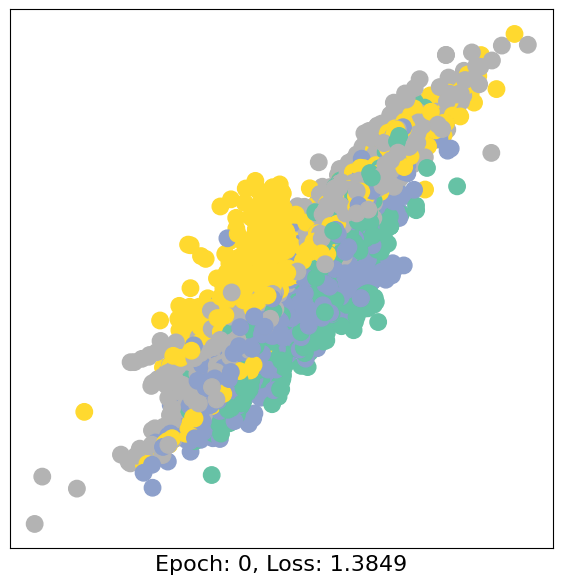

Epoch: 10, Loss: 1.2153065204620361, Accuracy: 0.42283509574164047


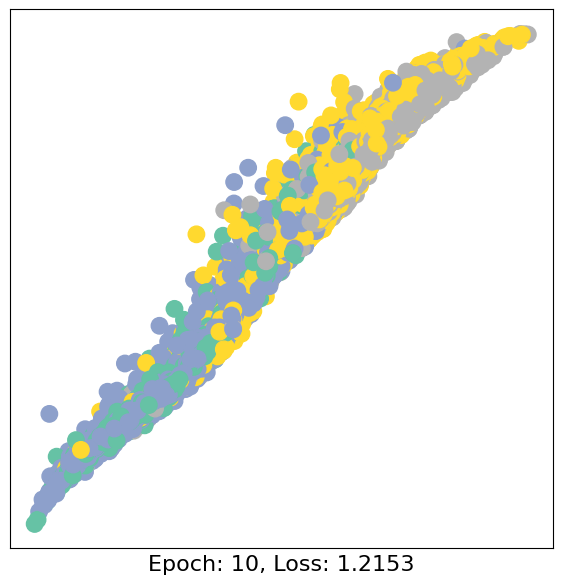

Epoch: 20, Loss: 1.0722616910934448, Accuracy: 0.5734495570162904


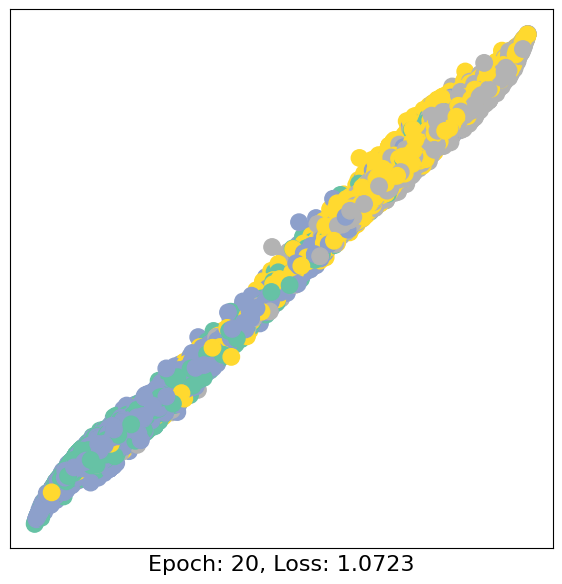

Epoch: 30, Loss: 0.9623702168464661, Accuracy: 0.5744498428122321


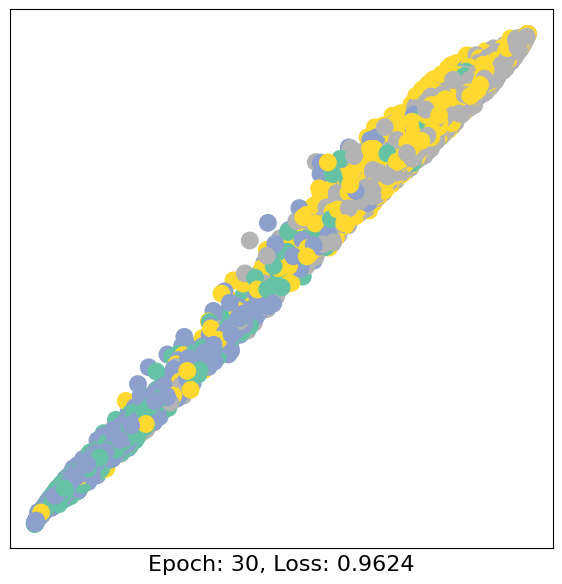

Epoch: 40, Loss: 0.8794823884963989, Accuracy: 0.5750214346956273


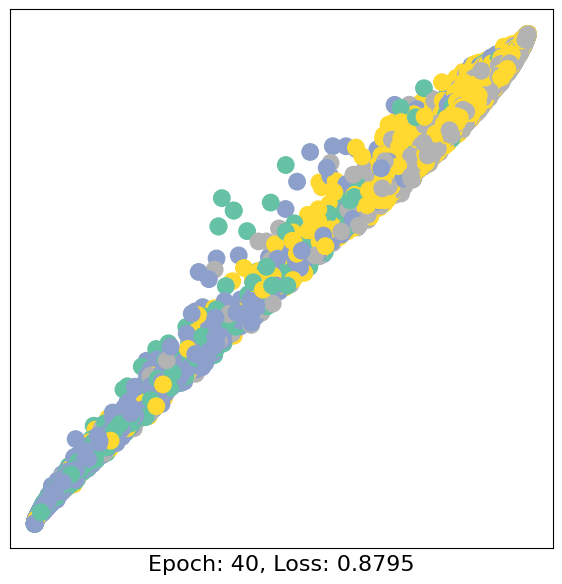

Epoch: 50, Loss: 0.8410137891769409, Accuracy: 0.5727350671620463


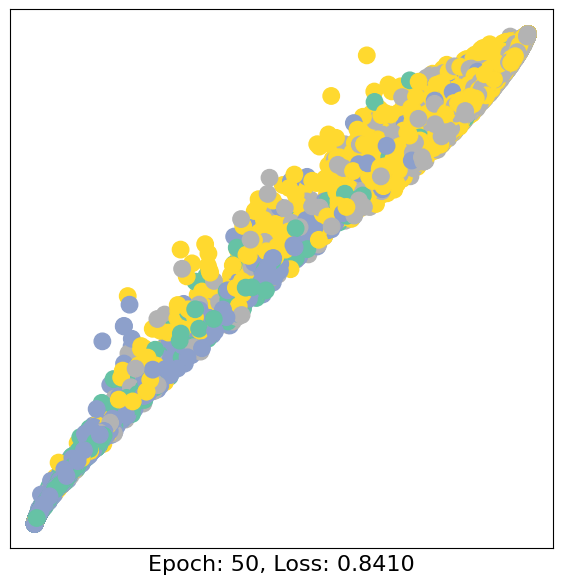

Epoch: 60, Loss: 0.8344311118125916, Accuracy: 0.5720205773078022


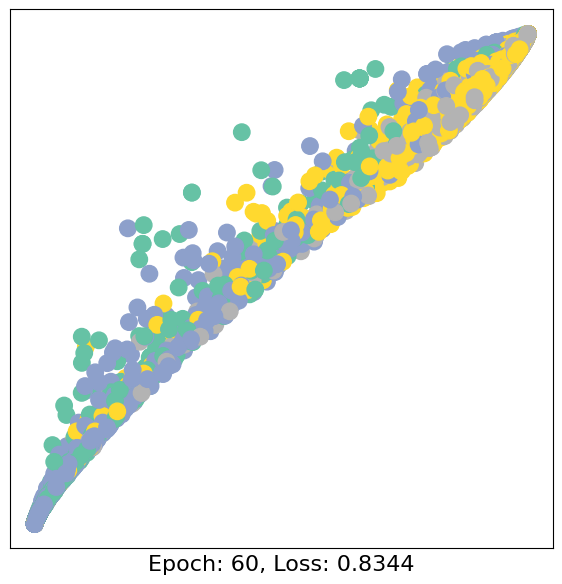

Epoch: 70, Loss: 0.811984658241272, Accuracy: 0.5724492712203487


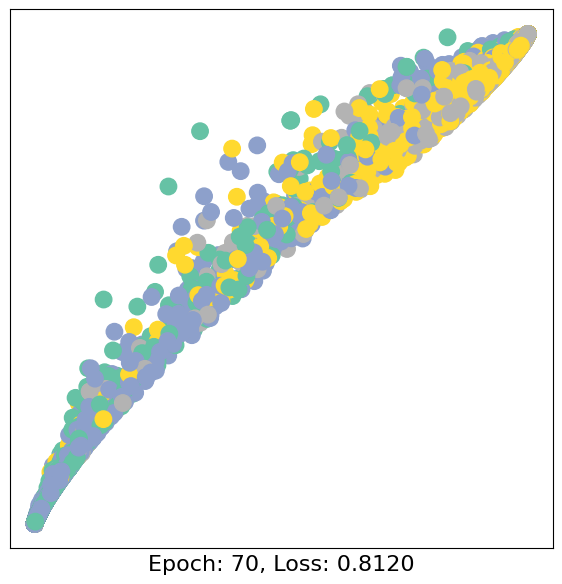

Epoch: 80, Loss: 0.8000316023826599, Accuracy: 0.5758788225207202


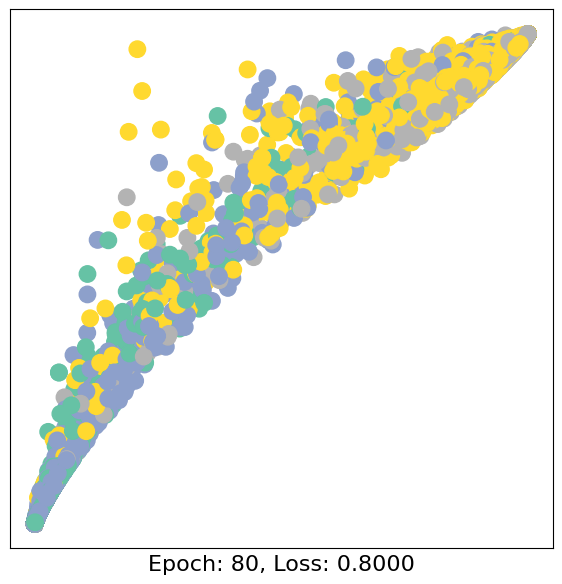

Epoch: 90, Loss: 0.7935881614685059, Accuracy: 0.5767362103458131


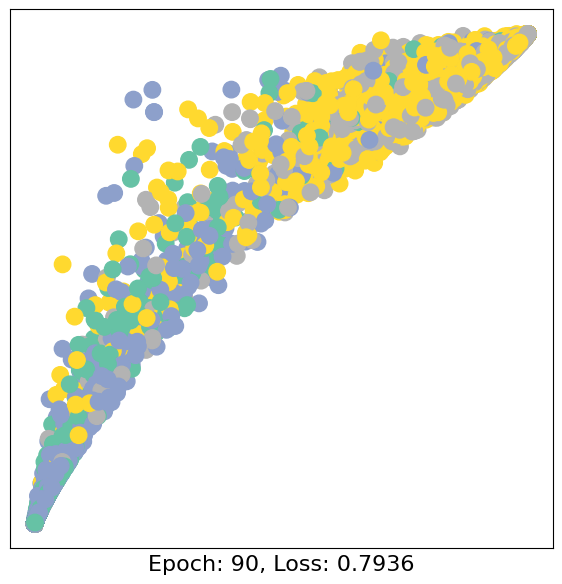

'\nfor epoch in range(100):\n    loss, h = train(data)\n    if epoch % 10 == 0:\n        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)\n        time.sleep(0.3)\n'

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 4)
        self.conv3 = GCNConv(4, 4)
        self.conv4 = GCNConv(4, 4)
        self.conv5 = GCNConv(4, 4)
        self.conv6 = GCNConv(4, 4)
        self.conv7 = GCNConv(4, 4)
        self.conv8 = GCNConv(4, 4)
        self.conv9 = GCNConv(4, 4)
        self.conv10 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()
        h = self.conv3(h, edge_index)
        h = h.tanh()
        h = self.conv4(h, edge_index)
        h = h.tanh()
        h = self.conv5(h, edge_index)
        h = h.tanh()
        h = self.conv6(h, edge_index)
        h = h.tanh()
        h = self.conv7(h, edge_index)
        h = h.tanh()
        h = self.conv8(h, edge_index)
        h = h.tanh()
        h = self.conv9(h, edge_index)
        h = h.tanh()
        h = self.conv10(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

from sklearn.metrics import accuracy_score

def test(data):
    model.eval()  # Set model to evaluation mode.
    with torch.no_grad():
        logits, _ = model(data.x, data.edge_index)
        pred = logits.argmax(dim=1)
        acc = accuracy_score(data.y[data.test_mask].cpu().numpy(), pred[data.test_mask].cpu().numpy())
    return acc

# Assuming you have defined data and visualize_embedding function

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        acc = test(data)
        print(f'Epoch: {epoch}, Loss: {loss.item()}, Accuracy: {acc}')
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''
for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''

υλοποιηση του GCN με 20 layers για αποσταση γειτονιας = 20, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 4)
  (conv4): GCNConv(4, 4)
  (conv5): GCNConv(4, 4)
  (conv6): GCNConv(4, 4)
  (conv7): GCNConv(4, 4)
  (conv8): GCNConv(4, 4)
  (conv9): GCNConv(4, 4)
  (conv10): GCNConv(4, 4)
  (conv11): GCNConv(4, 4)
  (conv12): GCNConv(4, 4)
  (conv13): GCNConv(4, 4)
  (conv14): GCNConv(4, 4)
  (conv15): GCNConv(4, 4)
  (conv16): GCNConv(4, 4)
  (conv17): GCNConv(4, 4)
  (conv18): GCNConv(4, 4)
  (conv19): GCNConv(4, 4)
  (conv20): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

Epoch: 0, Loss: 1.5007752180099487, Accuracy: 0.15247213489568448


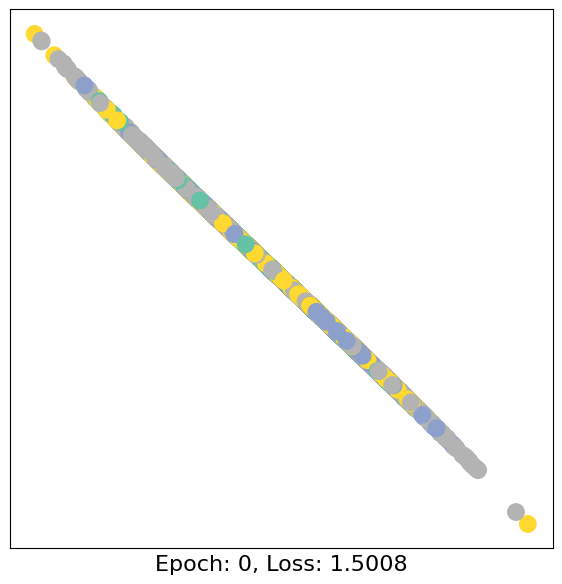

Epoch: 10, Loss: 1.3442050218582153, Accuracy: 0.4436981994855673


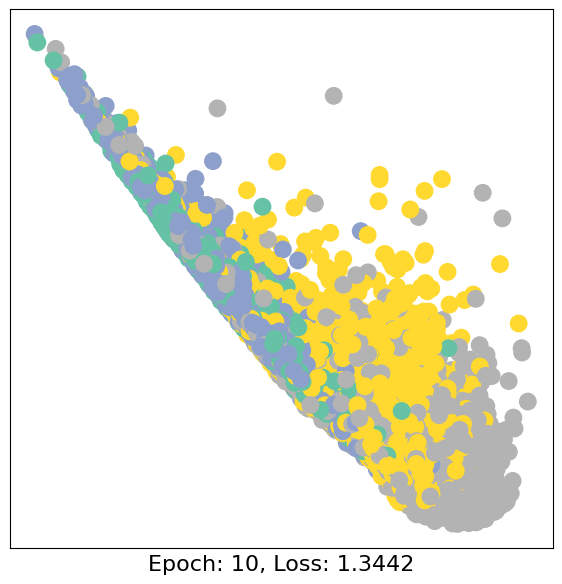

Epoch: 20, Loss: 1.1490452289581299, Accuracy: 0.5332952272077737


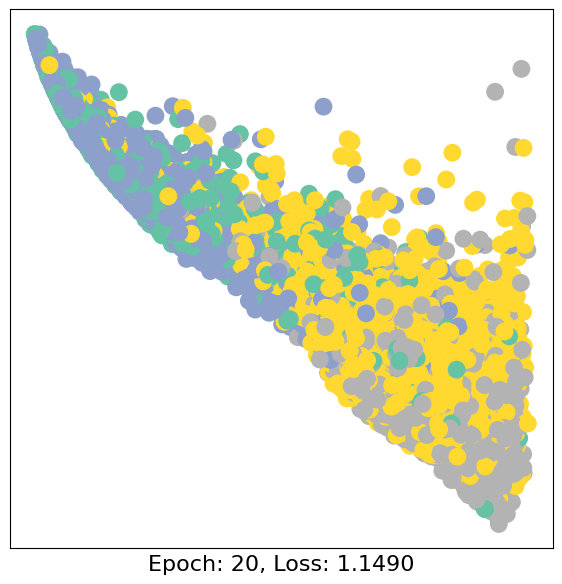

Epoch: 30, Loss: 1.0462061166763306, Accuracy: 0.526864818519577


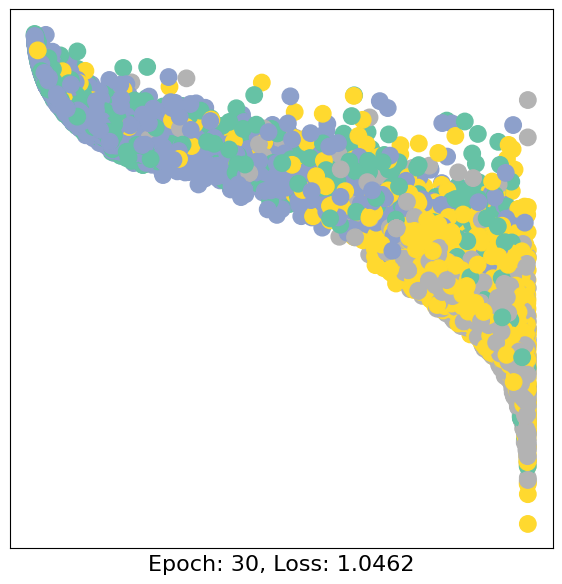

Epoch: 40, Loss: 0.9897093772888184, Accuracy: 0.5764504144041155


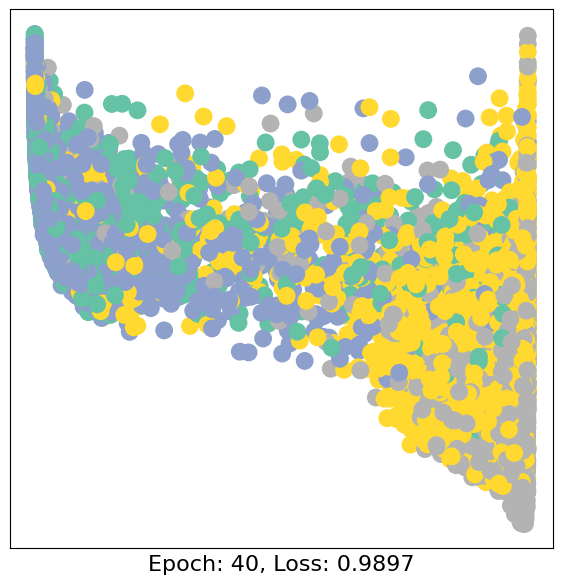

Epoch: 50, Loss: 0.9873331785202026, Accuracy: 0.5470134324092598


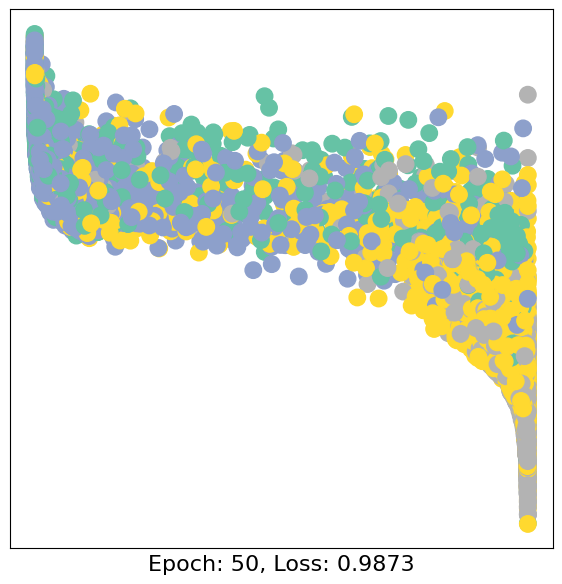

Epoch: 60, Loss: 0.9598158001899719, Accuracy: 0.5687339239782795


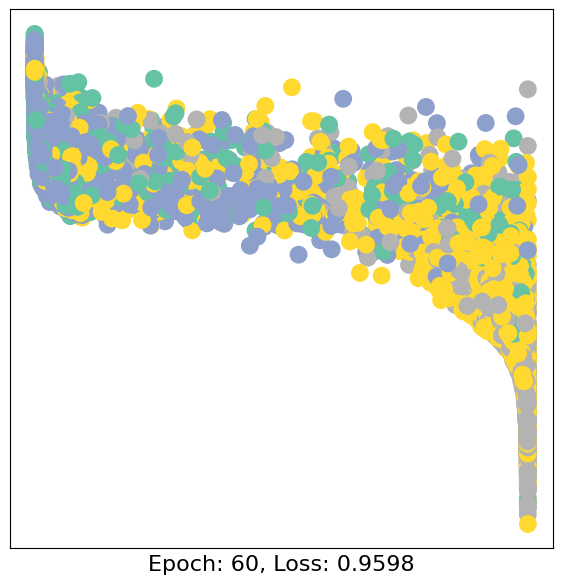

Epoch: 70, Loss: 0.8959218859672546, Accuracy: 0.624464132609317


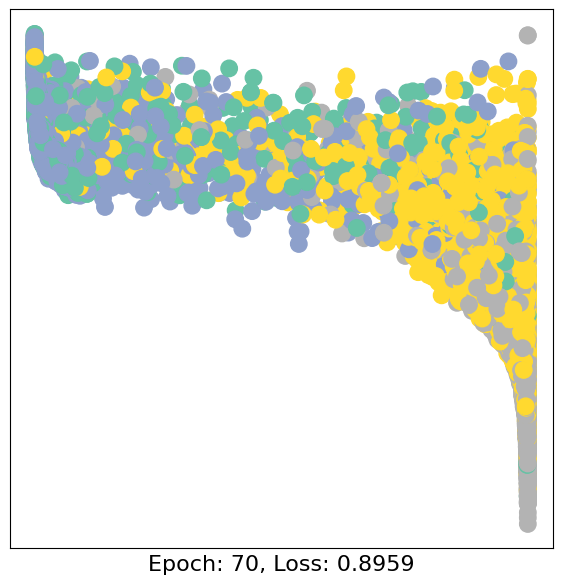

Epoch: 80, Loss: 0.872273862361908, Accuracy: 0.639039725635896


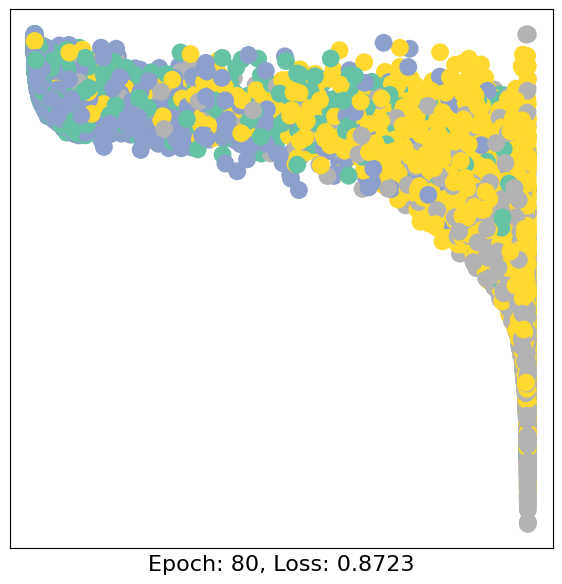

Epoch: 90, Loss: 0.8650560975074768, Accuracy: 0.6527579308373821


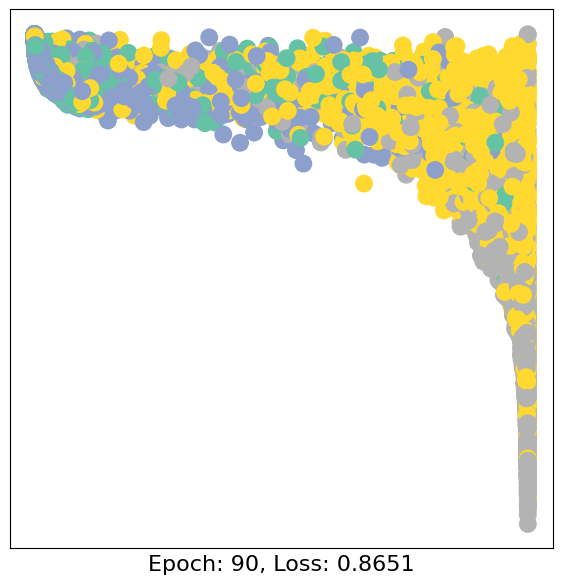

'\nfor epoch in range(100):\n    loss, h = train(data)\n    if epoch % 10 == 0:\n        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)\n        time.sleep(0.3)\n'

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 4)
        self.conv3 = GCNConv(4, 4)
        self.conv4 = GCNConv(4, 4)
        self.conv5 = GCNConv(4, 4)
        self.conv6 = GCNConv(4, 4)
        self.conv7 = GCNConv(4, 4)
        self.conv8 = GCNConv(4, 4)
        self.conv9 = GCNConv(4, 4)
        self.conv10 = GCNConv(4, 4)
        self.conv11 = GCNConv(4, 4)
        self.conv12 = GCNConv(4, 4)
        self.conv13 = GCNConv(4, 4)
        self.conv14 = GCNConv(4, 4)
        self.conv15 = GCNConv(4, 4)
        self.conv16 = GCNConv(4, 4)
        self.conv17 = GCNConv(4, 4)
        self.conv18 = GCNConv(4, 4)
        self.conv19 = GCNConv(4, 4)
        self.conv20 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()
        h = self.conv3(h, edge_index)
        h = h.tanh()
        h = self.conv4(h, edge_index)
        h = h.tanh()
        h = self.conv5(h, edge_index)
        h = h.tanh()
        h = self.conv6(h, edge_index)
        h = h.tanh()
        h = self.conv7(h, edge_index)
        h = h.tanh()
        h = self.conv8(h, edge_index)
        h = h.tanh()
        h = self.conv9(h, edge_index)
        h = h.tanh()
        h = self.conv10(h, edge_index)
        h = h.tanh()
        h = self.conv11(h, edge_index)
        h = h.tanh()
        h = self.conv12(h, edge_index)
        h = h.tanh()
        h = self.conv13(h, edge_index)
        h = h.tanh()
        h = self.conv14(h, edge_index)
        h = h.tanh()
        h = self.conv15(h, edge_index)
        h = h.tanh()
        h = self.conv16(h, edge_index)
        h = h.tanh()
        h = self.conv17(h, edge_index)
        h = h.tanh()
        h = self.conv18(h, edge_index)
        h = h.tanh()
        h = self.conv19(h, edge_index)
        h = h.tanh()
        h = self.conv20(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

from sklearn.metrics import accuracy_score

def test(data):
    model.eval()  # Set model to evaluation mode.
    with torch.no_grad():
        logits, _ = model(data.x, data.edge_index)
        pred = logits.argmax(dim=1)
        acc = accuracy_score(data.y[data.test_mask].cpu().numpy(), pred[data.test_mask].cpu().numpy())
    return acc

# Assuming you have defined data and visualize_embedding function

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        acc = test(data)
        print(f'Epoch: {epoch}, Loss: {loss.item()}, Accuracy: {acc}')
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''
for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''

υλοποιηση του GCN με 30 layers για αποσταση γειτονιας = 30, με βαση το notebook
 https://colab.research.google.com/drive/1h3-vJGRVloF5zStxL5I0rSy4ZUPNsjy8#scrollTo=AkQAVluLuxT_

GCN(
  (conv1): GCNConv(128, 4)
  (conv2): GCNConv(4, 4)
  (conv3): GCNConv(4, 4)
  (conv4): GCNConv(4, 4)
  (conv5): GCNConv(4, 4)
  (conv6): GCNConv(4, 4)
  (conv7): GCNConv(4, 4)
  (conv8): GCNConv(4, 4)
  (conv9): GCNConv(4, 4)
  (conv10): GCNConv(4, 4)
  (conv11): GCNConv(4, 4)
  (conv12): GCNConv(4, 4)
  (conv13): GCNConv(4, 4)
  (conv14): GCNConv(4, 4)
  (conv15): GCNConv(4, 4)
  (conv16): GCNConv(4, 4)
  (conv17): GCNConv(4, 4)
  (conv18): GCNConv(4, 4)
  (conv19): GCNConv(4, 4)
  (conv20): GCNConv(4, 4)
  (conv21): GCNConv(4, 4)
  (conv22): GCNConv(4, 4)
  (conv23): GCNConv(4, 4)
  (conv24): GCNConv(4, 4)
  (conv25): GCNConv(4, 4)
  (conv26): GCNConv(4, 4)
  (conv27): GCNConv(4, 4)
  (conv28): GCNConv(4, 4)
  (conv29): GCNConv(4, 4)
  (conv30): GCNConv(4, 2)
  (classifier): Linear(in_features=2, out_features=4, bias=True)
)


<IPython.core.display.Javascript object>

Epoch: 0, Loss: 1.3870110511779785, Accuracy: 0.30394398399542727


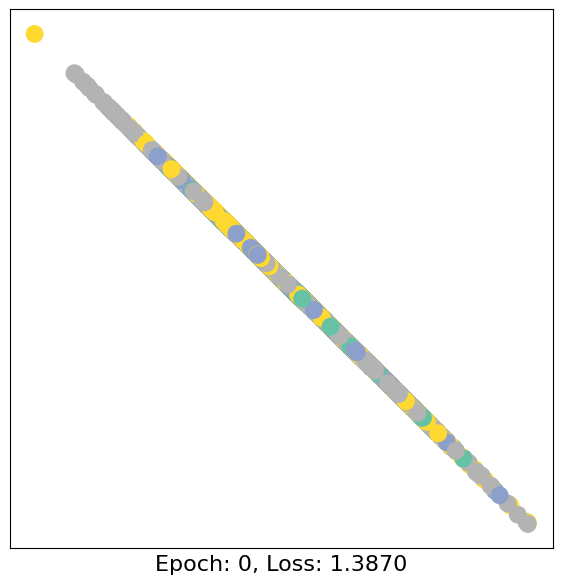

Epoch: 10, Loss: 1.3541032075881958, Accuracy: 0.30394398399542727


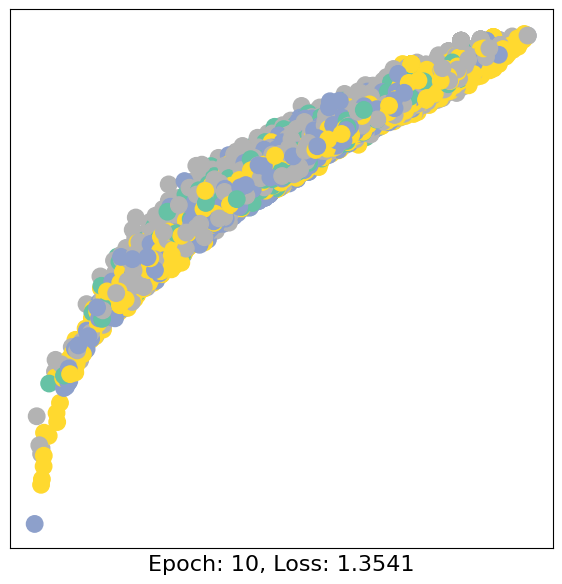

Epoch: 20, Loss: 1.2585196495056152, Accuracy: 0.440840240068591


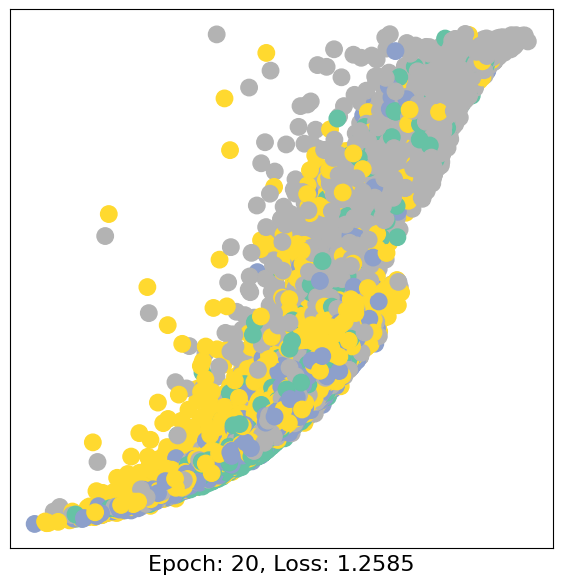

Epoch: 30, Loss: 1.1711426973342896, Accuracy: 0.5035724492712204


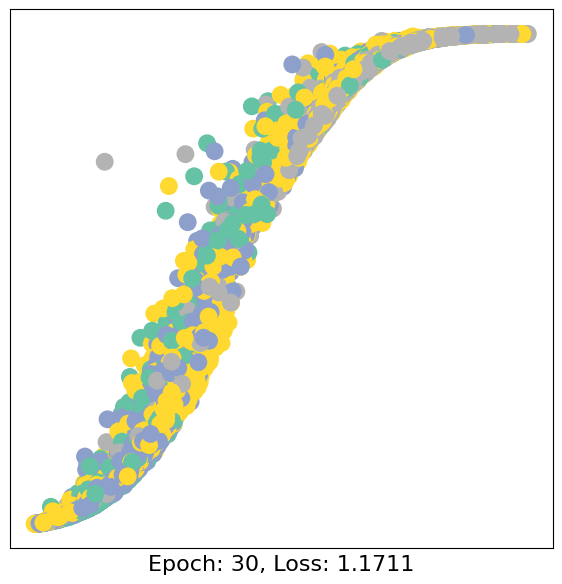

Epoch: 40, Loss: 1.1025469303131104, Accuracy: 0.4979994284081166


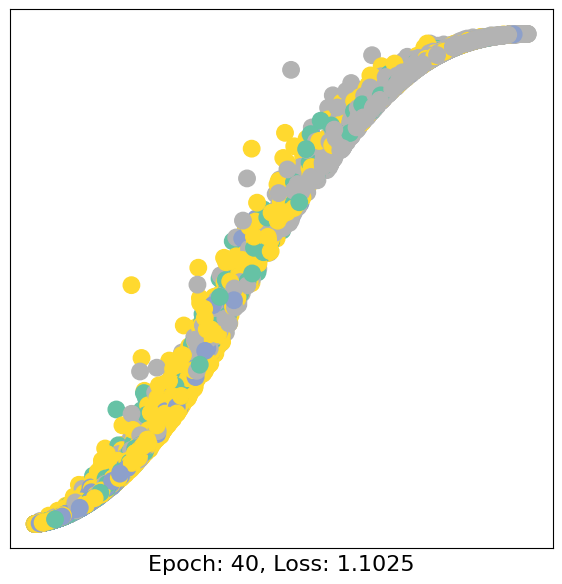

Epoch: 50, Loss: 1.0669970512390137, Accuracy: 0.559159759931409


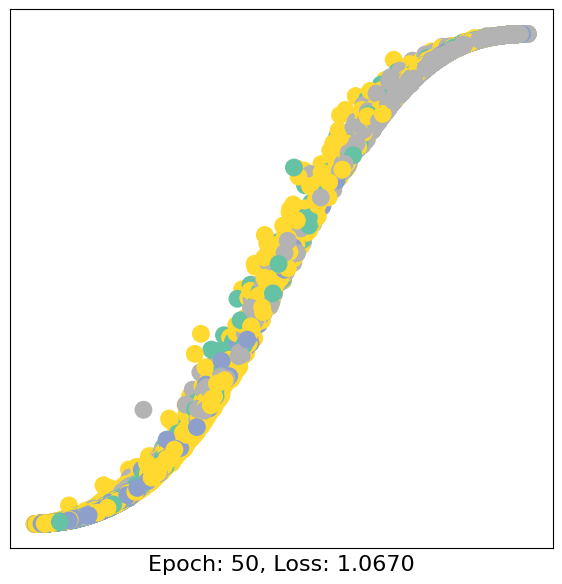

Epoch: 60, Loss: 1.0798227787017822, Accuracy: 0.5388682480708774


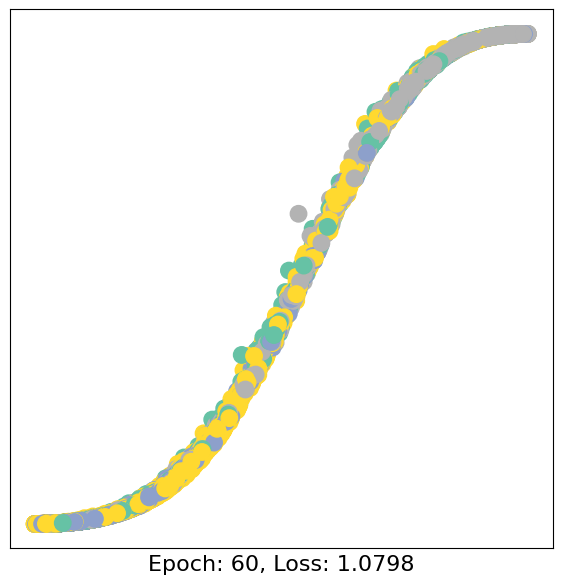

Epoch: 70, Loss: 1.104941487312317, Accuracy: 0.5388682480708774


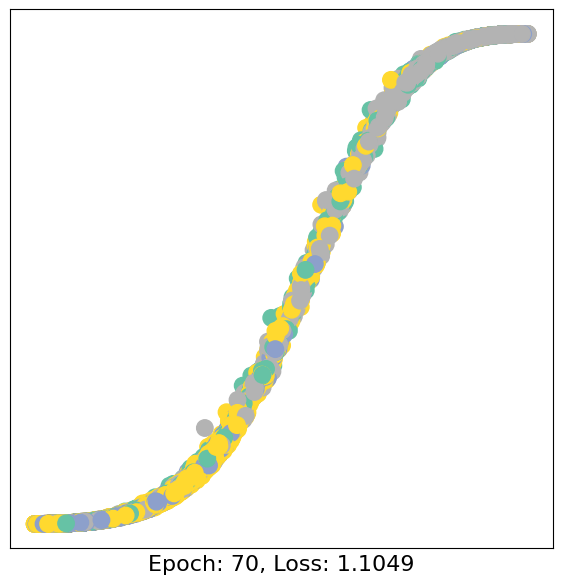

Epoch: 80, Loss: 1.0448211431503296, Accuracy: 0.5635895970277222


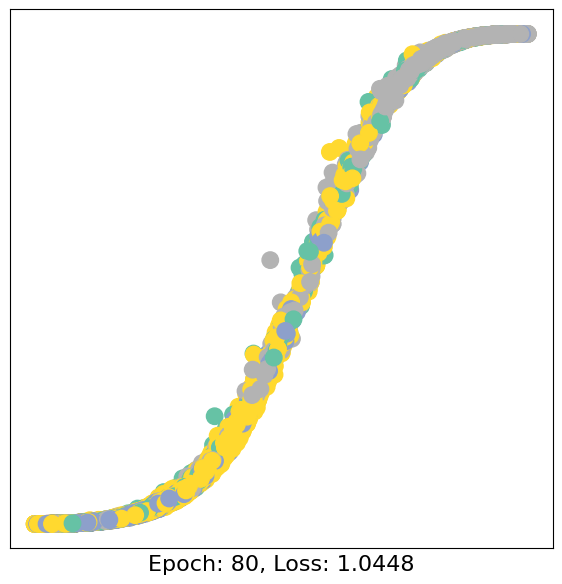

Epoch: 90, Loss: 1.0174834728240967, Accuracy: 0.567590740211489


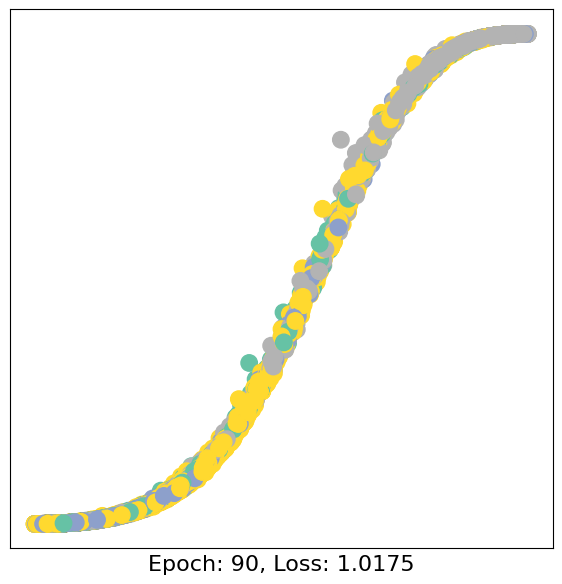

'\nfor epoch in range(100):\n    loss, h = train(data)\n    if epoch % 10 == 0:\n        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)\n        time.sleep(0.3)\n'

In [ ]:
import torch
from torch.nn import Linear
from torch_geometric.nn import GCNConv


class GCN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        torch.manual_seed(1234)
        self.conv1 = GCNConv(dataset.num_features, 4)
        self.conv2 = GCNConv(4, 4)
        self.conv3 = GCNConv(4, 4)
        self.conv4 = GCNConv(4, 4)
        self.conv5 = GCNConv(4, 4)
        self.conv6 = GCNConv(4, 4)
        self.conv7 = GCNConv(4, 4)
        self.conv8 = GCNConv(4, 4)
        self.conv9 = GCNConv(4, 4)
        self.conv10 = GCNConv(4, 4)
        self.conv11 = GCNConv(4, 4)
        self.conv12 = GCNConv(4, 4)
        self.conv13 = GCNConv(4, 4)
        self.conv14 = GCNConv(4, 4)
        self.conv15 = GCNConv(4, 4)
        self.conv16 = GCNConv(4, 4)
        self.conv17 = GCNConv(4, 4)
        self.conv18 = GCNConv(4, 4)
        self.conv19 = GCNConv(4, 4)
        self.conv20 = GCNConv(4, 4)
        self.conv21 = GCNConv(4, 4)
        self.conv22 = GCNConv(4, 4)
        self.conv23 = GCNConv(4, 4)
        self.conv24 = GCNConv(4, 4)
        self.conv25 = GCNConv(4, 4)
        self.conv26 = GCNConv(4, 4)
        self.conv27 = GCNConv(4, 4)
        self.conv28 = GCNConv(4, 4)
        self.conv29 = GCNConv(4, 4)
        self.conv30 = GCNConv(4, 2)
        self.classifier = Linear(2, dataset.num_classes)

    def forward(self, x, edge_index):
        h = self.conv1(x, edge_index)
        h = h.tanh()
        h = self.conv2(h, edge_index)
        h = h.tanh()
        h = self.conv3(h, edge_index)
        h = h.tanh()
        h = self.conv4(h, edge_index)
        h = h.tanh()
        h = self.conv5(h, edge_index)
        h = h.tanh()
        h = self.conv6(h, edge_index)
        h = h.tanh()
        h = self.conv7(h, edge_index)
        h = h.tanh()
        h = self.conv8(h, edge_index)
        h = h.tanh()
        h = self.conv9(h, edge_index)
        h = h.tanh()
        h = self.conv10(h, edge_index)
        h = h.tanh()
        h = self.conv11(h, edge_index)
        h = h.tanh()
        h = self.conv12(h, edge_index)
        h = h.tanh()
        h = self.conv13(h, edge_index)
        h = h.tanh()
        h = self.conv14(h, edge_index)
        h = h.tanh()
        h = self.conv15(h, edge_index)
        h = h.tanh()
        h = self.conv16(h, edge_index)
        h = h.tanh()
        h = self.conv17(h, edge_index)
        h = h.tanh()
        h = self.conv18(h, edge_index)
        h = h.tanh()
        h = self.conv19(h, edge_index)
        h = h.tanh()
        h = self.conv20(h, edge_index)
        h = h.tanh()
        h = self.conv21(h, edge_index)
        h = h.tanh()
        h = self.conv22(h, edge_index)
        h = h.tanh()
        h = self.conv23(h, edge_index)
        h = h.tanh()
        h = self.conv24(h, edge_index)
        h = h.tanh()
        h = self.conv25(h, edge_index)
        h = h.tanh()
        h = self.conv26(h, edge_index)
        h = h.tanh()
        h = self.conv27(h, edge_index)
        h = h.tanh()
        h = self.conv28(h, edge_index)
        h = h.tanh()
        h = self.conv29(h, edge_index)
        h = h.tanh()
        h = self.conv30(h, edge_index)
        h = h.tanh()  # Final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN()
print(model)


################################################################

import time
from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 430})'''))

model = GCN()
criterion = torch.nn.CrossEntropyLoss()  # Define loss criterion.
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Define optimizer.

def train(data):
    optimizer.zero_grad()  # Clear gradients.
    out, h = model(data.x, data.edge_index)  # Perform a single forward pass.
    loss = criterion(out[data.train_mask], data.y[data.train_mask])  # Compute the loss solely based on the training nodes.
    loss.backward()  # Derive gradients.
    optimizer.step()  # Update parameters based on gradients.
    return loss, h

from sklearn.metrics import accuracy_score

def test(data):
    model.eval()  # Set model to evaluation mode.
    with torch.no_grad():
        logits, _ = model(data.x, data.edge_index)
        pred = logits.argmax(dim=1)
        acc = accuracy_score(data.y[data.test_mask].cpu().numpy(), pred[data.test_mask].cpu().numpy())
    return acc

# Assuming you have defined data and visualize_embedding function

for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        acc = test(data)
        print(f'Epoch: {epoch}, Loss: {loss.item()}, Accuracy: {acc}')
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''
for epoch in range(100):
    loss, h = train(data)
    if epoch % 10 == 0:
        visualize_embedding(h, color=data.y, epoch=epoch, loss=loss)
        time.sleep(0.3)
'''

παρατηρω οτι οσο αυξανονται οι γειτονιες (δλδ οι αποσταση γειτνιασης) , δλδ τα layers του GCN, οτι δεν υπαρχει απαραιτητα και βελτιωση αποτελεσματων του classification (το loss δλδ δεν μειωνεται οσο αυξανονται τα layers, και ο διαχωρισμος των classes δεν ειναι παραπανω ευδιακριτος) .

Αυτο οφειλεται στο οτι το συγκεκριμενο dataset του Facebook δεν εχει παρα πολλα features οπως αλλα datasets πχ Cora dataset

Οποτε και με λιγα layers αρκει για να εχουμε καλο classification (linear separation) και καλη ποιοτητα στα παραγομενα node embeddings

# **απ τη δικη μου υλοποιηση του GCN** (αγνοηστε το, ειναι δοκιμαστικο προχειρο)

In [ ]:
class GCN(torch.nn.Module):
    def __init__(self, dim_in, dim_h2, dim_h3, dim_h4, dim_out):
        super().__init__()
        self.gcn1 = GCNConv(dim_in, dim_h2)
        self.gcn2 = GCNConv(dim_h2, dim_h3)
        self.gcn3 = GCNConv(dim_h3, dim_h4)
        self.gcn4 = GCNConv(dim_h4, dim_out)


# Η forward method ομοιως έχει δύο επίπεδα GCN. Μια συνάρτηση softmax εφαρμόζεται στο output για classification
    def forward(self, x, edge_index):
        h = self.gcn1(x, edge_index)
        h = torch.relu(h)
        h = self.gcn2(h, edge_index)
        h = torch.relu(h)
        h = self.gcn3(h, edge_index)
        h = torch.relu(h)
        h = self.gcn4(h, edge_index)
        return F.log_softmax(h, dim=1)

# Η fit() είναι με τις ίδιες ακριβώς παραμέτρους για το Adam optimizer (ρυθμός εκμάθησης 0,1 και normalization L2 0,0005):
    def fit(self, data, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=0.01, weight_decay=5e-4)

        self.train()
        for epoch in range(epochs+1):
            optimizer.zero_grad()
            out = self(data.x, data.edge_index)
            loss = criterion(out[data.train_mask], data.y[data.train_mask])
            acc = accuracy(out[data.train_mask].argmax(dim=1), data.y[data.train_mask])
            loss.backward()
            optimizer.step()

            if epoch % 20 == 0:
                val_loss = criterion(out[data.val_mask], data.y[data.val_mask])
                val_acc = accuracy(out[data.val_mask].argmax(dim=1), data.y[data.val_mask])
                print(f'Epoch {epoch:>3} | Train Loss: {loss:.3f} | Train Acc:'
                      f' {acc*100:>5.2f}% | Val Loss: {val_loss:.2f} | '
                      f'Val Acc: {val_acc*100:.2f}%')

# υλοποιηση της test() method

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, data.edge_index)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc


# ***Ερωτημα Γ1***

# τωρα θα κανω υλοποιηση των αλγοριθμων GNN, GAT και GraphSage, για αποσταση γειτνιασης = 2





# **GNN**

In [ ]:
import torch
torch.manual_seed(0)
from torch.nn import Linear
import torch.nn.functional as F

def accuracy(y_pred, y_true):
    """Calculate accuracy."""
    return torch.sum(y_pred == y_true) / len(y_true)

class VanillaGNNLayer(torch.nn.Module):
    def __init__(self, dim_in, dim_out):
        super().__init__()
        self.linear = Linear(dim_in, dim_out, bias=False)

    def forward(self, x, adjacency):
        x = self.linear(x)
        x = torch.sparse.mm(adjacency, x)
        return x
from torch_geometric.utils import to_dense_adj

adjacency = to_dense_adj(data.edge_index)[0]
adjacency += torch.eye(len(adjacency))
print(adjacency)

class VanillaGNN(torch.nn.Module):
    """Vanilla Graph Neural Network"""
    def __init__(self, dim_in, dim_h, dim_out):
        super().__init__()
        self.gnn1 = VanillaGNNLayer(dim_in, dim_h)
        self.gnn2 = VanillaGNNLayer(dim_h, dim_out)

    def forward(self, x, adjacency):
        h = self.gnn1(x, adjacency)
        h = torch.relu(h)
        h = self.gnn2(h, adjacency)
        return F.log_softmax(h, dim=1)

    def fit(self, data, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(),
                                      lr=0.01,
                                      weight_decay=5e-4)

        self.train()
        for epoch in range(epochs+1):
            optimizer.zero_grad()
            out = self(data.x, adjacency)
            loss = criterion(out[data.train_mask], data.y[data.train_mask])
            acc = accuracy(out[data.train_mask].argmax(dim=1),
                          data.y[data.train_mask])
            loss.backward()
            optimizer.step()

            if(epoch % 20 == 0):
                val_loss = criterion(out[data.val_mask], data.y[data.val_mask])
                val_acc = accuracy(out[data.val_mask].argmax(dim=1),
                                  data.y[data.val_mask])
                print(f'Epoch {epoch:>3} | Train Loss: {loss:.3f} | Train Acc:'
                      f' {acc*100:>5.2f}% | Val Loss: {val_loss:.2f} | '
                      f'Val Acc: {val_acc*100:.2f}%')

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, adjacency)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc

# Create the Vanilla GNN model
gnn = VanillaGNN(dataset.num_features, 16, dataset.num_classes)
print(gnn)

# Train
gnn.fit(data, epochs=100)

# Test
acc = gnn.test(data)
print(f'\nGNN test accuracy: {acc*100:.2f}%')

# Adjacency matrix
adjacency = to_dense_adj(data.edge_index)[0]
adjacency += torch.eye(len(adjacency))
adjacency

'''
# MLP
mlp = MLP(dataset.num_features, 16, dataset.num_classes)
print(mlp)
mlp.fit(data, epochs=100)
acc = mlp.test(data)
print(f'\nMLP test accuracy: {acc*100:.2f}%\n')
'''

# GNN
gnn = VanillaGNN(dataset.num_features, 16, dataset.num_classes)
print(gnn)
gnn.fit(data, epochs=100)
acc = gnn.test(data)
print(f'\nGNN test accuracy: {acc*100:.2f}%')

tensor([[1., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 1.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 1., 0.],
        [0., 0., 0.,  ..., 0., 0., 1.]])
VanillaGNN(
  (gnn1): VanillaGNNLayer(
    (linear): Linear(in_features=128, out_features=16, bias=False)
  )
  (gnn2): VanillaGNNLayer(
    (linear): Linear(in_features=16, out_features=4, bias=False)
  )
)
Epoch   0 | Train Loss: 150.572 | Train Acc: 17.87% | Val Loss: 147.91 | Val Acc: 17.07%
Epoch  20 | Train Loss: 4.207 | Train Acc: 79.06% | Val Loss: 4.52 | Val Acc: 79.13%
Epoch  40 | Train Loss: 1.476 | Train Acc: 80.03% | Val Loss: 1.60 | Val Acc: 80.43%
Epoch  60 | Train Loss: 0.886 | Train Acc: 79.89% | Val Loss: 0.95 | Val Acc: 79.83%
Epoch  80 | Train Loss: 0.690 | Train Acc: 81.32% | Val Loss: 0.73 | Val Acc: 80.70%
Epoch 100 | Train Loss: 0.605 | Train Acc: 82.16% | Val Loss: 0.66 | Val Acc: 81.33%

GNN test accuracy: 81.6

# **GAT (Graph Attention Networks)**

In [ ]:
import torch
!pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(1)
torch.cuda.manual_seed(1)
torch.cuda.manual_seed_all(1)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
from torch_geometric.datasets import FacebookPagePage
dataset = FacebookPagePage(root=".")
data = dataset[0]

data.train_mask = range(1,12470)
data.val_mask = range(12471, 15471)
data.test_mask = range(15472, 22470)

In [ ]:
import torch
torch.manual_seed(1)
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv, GCNConv
from torch.nn import Linear, Dropout


def accuracy(y_pred, y_true):
    """Calculate accuracy."""
    return torch.sum(y_pred == y_true) / len(y_true)


class GAT(torch.nn.Module):
    def __init__(self, dim_in, dim_h, dim_out, heads=8):
        super().__init__()
        self.gat1 = GATConv(dim_in, dim_h, heads=heads)
        self.gat2 = GATConv(dim_h*heads, dim_out, heads=1)

    def forward(self, x, edge_index):
        h = F.dropout(x, p=0.6, training=self.training)
        h = self.gat1(h, edge_index)
        h = F.elu(h)
        h = F.dropout(h, p=0.6, training=self.training)
        h = self.gat2(h, edge_index)
        return F.log_softmax(h, dim=1)

    def fit(self, data, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=0.01, weight_decay=0.01)

        self.train()
        for epoch in range(epochs+1):
            optimizer.zero_grad()
            out = self(data.x, data.edge_index)
            loss = criterion(out[data.train_mask], data.y[data.train_mask])
            acc = accuracy(out[data.train_mask].argmax(dim=1), data.y[data.train_mask])
            loss.backward()
            optimizer.step()

            if(epoch % 20 == 0):
                val_loss = criterion(out[data.val_mask], data.y[data.val_mask])
                val_acc = accuracy(out[data.val_mask].argmax(dim=1), data.y[data.val_mask])
                print(f'Epoch {epoch:>3} | Train Loss: {loss:.3f} | Train Acc: {acc*100:>5.2f}% | Val Loss: {val_loss:.2f} | Val Acc: {val_acc*100:.2f}%')

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, data.edge_index)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc

# Create the Vanilla GNN model
gat = GAT(dataset.num_features, 32, dataset.num_classes)
print(gat)

# Train
gat.fit(data, epochs=100)

# Test
acc = gat.test(data)
print(f'GAT test accuracy: {acc*100:.2f}%')

GAT(
  (gat1): GATConv(128, 32, heads=8)
  (gat2): GATConv(256, 4, heads=1)
)
Epoch   0 | Train Loss: 1.816 | Train Acc: 21.96% | Val Loss: 1.85 | Val Acc: 23.10%
Epoch  20 | Train Loss: 0.395 | Train Acc: 86.44% | Val Loss: 0.40 | Val Acc: 86.33%
Epoch  40 | Train Loss: 0.378 | Train Acc: 87.40% | Val Loss: 0.37 | Val Acc: 87.63%
Epoch  60 | Train Loss: 0.357 | Train Acc: 87.83% | Val Loss: 0.37 | Val Acc: 87.17%
Epoch  80 | Train Loss: 0.341 | Train Acc: 88.44% | Val Loss: 0.34 | Val Acc: 87.77%
Epoch 100 | Train Loss: 0.335 | Train Acc: 88.63% | Val Loss: 0.35 | Val Acc: 88.10%
GAT test accuracy: 91.14%


# **GraphSAGE**

In [ ]:
import torch
!pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(-1)
torch.cuda.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 53.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 932.1/932.1 kB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.0/565.0 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from torch_geometric.datasets import FacebookPagePage
dataset = FacebookPagePage(root=".")
data = dataset[0]

data.train_mask = range(0,12469)
data.val_mask = range(12470, 15470)
data.test_mask = range(15471, 22470)

In [ ]:
from torch_geometric.loader import NeighborLoader
from torch_geometric.utils import to_networkx

# Create batches with neighbor sampling
train_loader = NeighborLoader(
    data,
    num_neighbors=[5, 10],
    batch_size=16,
    input_nodes=data.train_mask,
)

# Print each subgraph
for i, subgraph in enumerate(train_loader):
    print(f'Subgraph {i}: {subgraph}')

Subgraph 0: Data(x=[526, 128], edge_index=[2, 650], y=[526], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[526], e_id=[650], input_id=[16], batch_size=16)
Subgraph 1: Data(x=[519, 128], edge_index=[2, 632], y=[519], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[519], e_id=[632], input_id=[16], batch_size=16)
Subgraph 2: Data(x=[590, 128], edge_index=[2, 735], y=[590], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[590], e_id=[735], input_id=[16], batch_size=16)
Subgraph 3: Data(x=[501, 128], edge_index=[2, 631], y=[501], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[501], e_id=[631], input_id=[16], batch_size=16)
Subgraph 4: Data(x=[500, 128], edge_index=[2, 691], y=[500], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[500], e_id=[691], input_id=[16], batch_size=16)
Subgraph 5: Data(x=[528, 128], edge_index=[2, 699], y=[528], train_mask=[12469], val_mask=[3000], test_mask=[6999], n_id=[528], e_id=[699], input_id=[

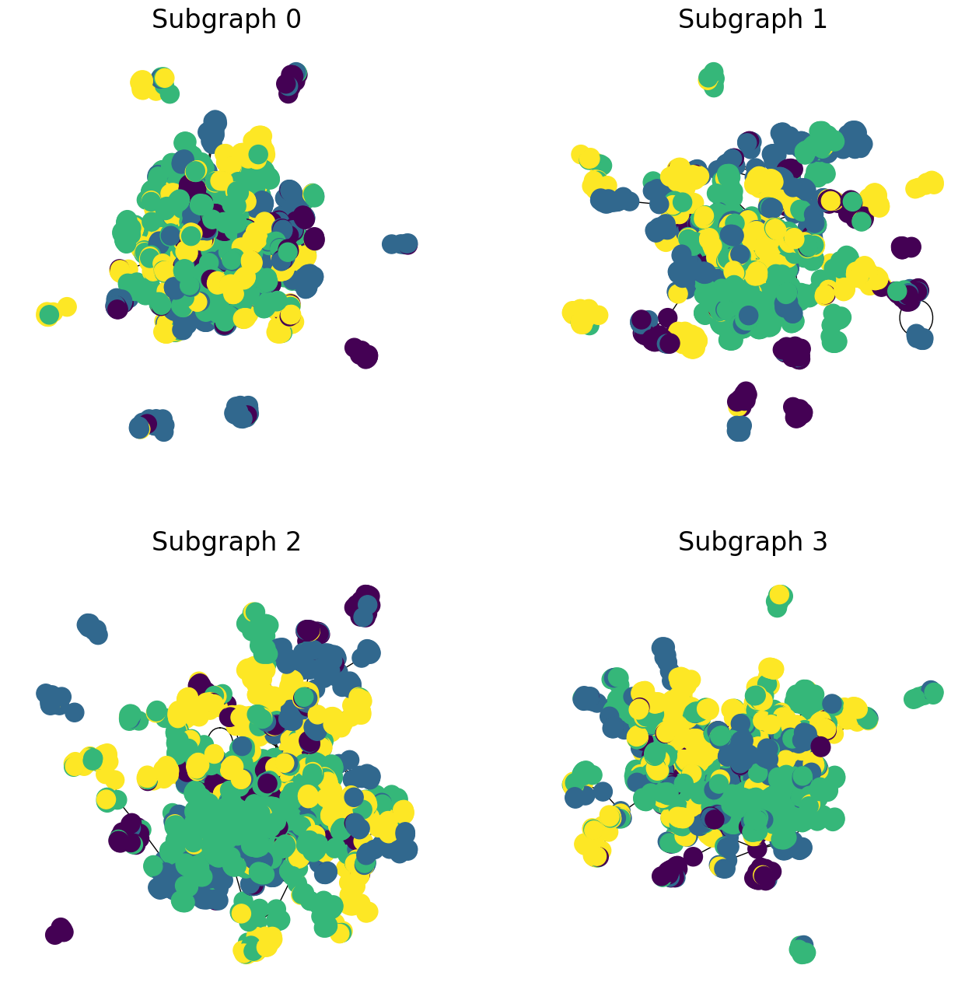

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Plot each subgraph
fig = plt.figure(figsize=(16,16))
for idx, (subdata, pos) in enumerate(zip(train_loader, [221, 222, 223, 224])):
    G = to_networkx(subdata, to_undirected=True)
    ax = fig.add_subplot(pos)
    ax.set_title(f'Subgraph {idx}', fontsize=24)
    plt.axis('off')
    nx.draw_networkx(G,
                    pos=nx.spring_layout(G, seed=0),
                    with_labels=False,
                    node_color=subdata.y,
                    )
plt.show()

επειδη οταν εβαζα να εχει πολλα subgraphs εβγαζε στη συνεχεια σφαλμα κατα το τρεξιμο του GraphSAGE model, το ξανατρεχω απ την αρχη και οριζω:

''πληθος sub-graphs'' = 4 = train_mask/batches of nodes = 12472/3118

In [ ]:
import torch
!pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(-1)
torch.cuda.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 73.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 86.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 46.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 932.1/932.1 kB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 565.0/565.0 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from torch_geometric.datasets import FacebookPagePage
dataset = FacebookPagePage(root=".")
data = dataset[0]

Processing...
Done!


In [ ]:
print('Dataset: {dataset}')
print('-----------------------')
print('Number of graphs: {len(dataset)}')
print('Number of nodes: {data.x.shape[0]}')
print('Number of classes: {dataset.num_classes}')

print('\nGraph:')
print('------')
print('Edges are directed:'), print({data.is_directed()})
print('Graph has isolated nodes:'), print({data.has_isolated_nodes()})
print('Graph has loops:'), print({data.has_self_loops()})

Dataset: {dataset}
-----------------------
Number of graphs: {len(dataset)}
Number of nodes: {data.x.shape[0]}
Number of classes: {dataset.num_classes}

Graph:
------
Edges are directed:
{False}
Graph has isolated nodes:
{False}
Graph has loops:
{True}


(None, None)

In [ ]:
data.train_mask = range(0,12471)
data.val_mask = range(12470, 15470)
data.test_mask = range(15471, 22469)

In [ ]:
from torch_geometric.loader import NeighborLoader
from torch_geometric.utils import to_networkx

# Create batches with neighbor sampling
train_loader = NeighborLoader(
    data,
    num_neighbors=[10, 10],
    batch_size=3118, # το ορισα σε αυτη την τιμη, ωστε να εχω πληθος sub-graphs = 4 = train_mask/batches of nodes = 12472/3118
    input_nodes=data.train_mask,
)

# Print each subgraph
for i, subgraph in enumerate(train_loader):
    print(f'Subgraph {i}: {subgraph}')

Subgraph 0: Data(x=[18912, 128], edge_index=[2, 93065], y=[18912], train_mask=[12471], val_mask=[3000], test_mask=[6998], input_id=[3118], batch_size=3118)
Subgraph 1: Data(x=[18762, 128], edge_index=[2, 91996], y=[18762], train_mask=[12471], val_mask=[3000], test_mask=[6998], input_id=[3118], batch_size=3118)
Subgraph 2: Data(x=[18890, 128], edge_index=[2, 93938], y=[18890], train_mask=[12471], val_mask=[3000], test_mask=[6998], input_id=[3118], batch_size=3118)
Subgraph 3: Data(x=[18907, 128], edge_index=[2, 93230], y=[18907], train_mask=[12471], val_mask=[3000], test_mask=[6998], input_id=[3117], batch_size=3117)


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import tensorflow as tf

# Check the available GPU devices
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Set memory growth to avoid allocating all GPU memory at once
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

    # Set the GPU device manually (optional)
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

    print('GPU activated and configured for maximum performance.')
else:
    print("No GPU available. Switch to GPU runtime in Colab.")


No GPU available. Switch to GPU runtime in Colab.


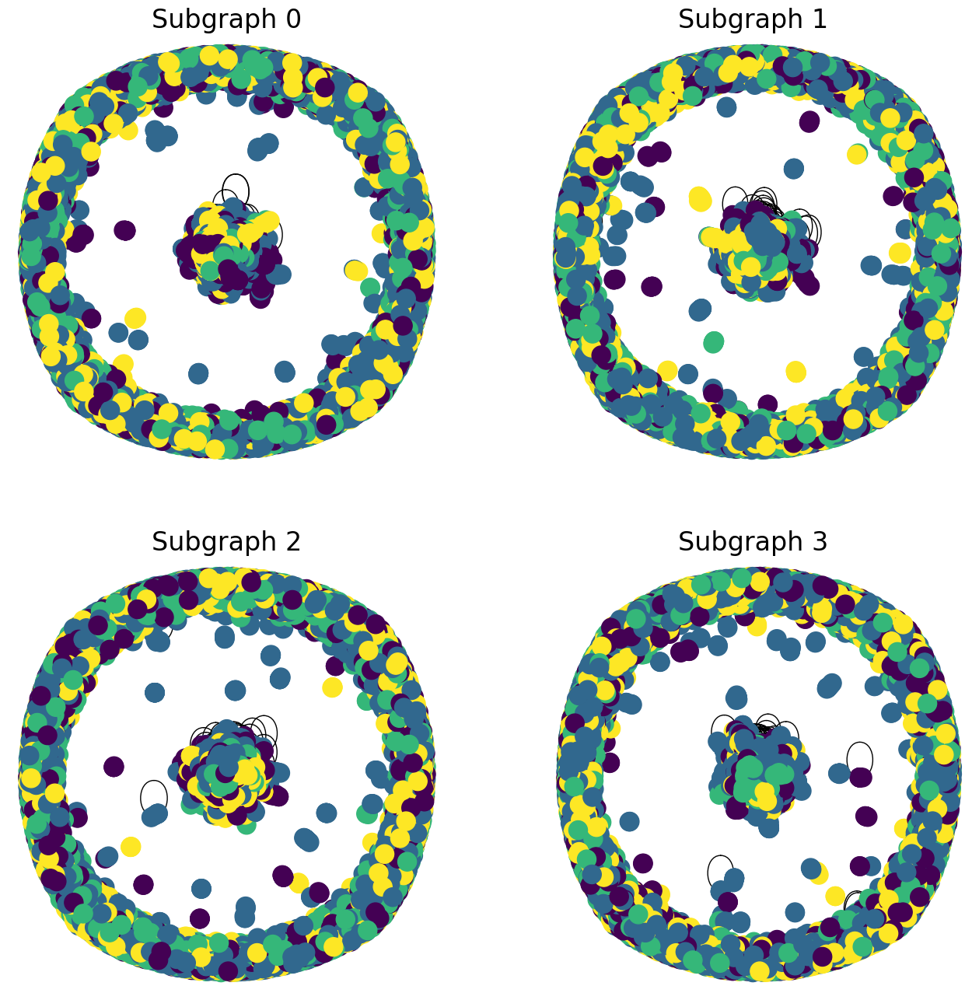

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Plot each subgraph
fig = plt.figure(figsize=(16,16))
for idx, (subdata, pos) in enumerate(zip(train_loader, [221, 222, 223, 224])):
    G = to_networkx(subdata, to_undirected=True)
    ax = fig.add_subplot(pos)
    ax.set_title(f'Subgraph {idx}', fontsize=24)
    plt.axis('off')
    nx.draw_networkx(G,
                    pos=nx.spring_layout(G, seed=0),
                    with_labels=False,
                    node_color=subdata.y,
                    )
plt.show()

In [ ]:
import torch
torch.manual_seed(-1)
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv


def accuracy(pred_y, y):
    """Calculate accuracy."""
    return ((pred_y == y).sum() / len(y)).item()


class GraphSAGE(torch.nn.Module):
    """GraphSAGE"""
    def __init__(self, dim_in, dim_h, dim_out):
        super().__init__()
        self.sage1 = SAGEConv(dim_in, dim_h)
        self.sage2 = SAGEConv(dim_h, dim_out)

    def forward(self, x, edge_index):
        h = self.sage1(x, edge_index)
        h = torch.relu(h)
        h = F.dropout(h, p=0.5, training=self.training)
        h = self.sage2(h, edge_index)
        return h

    def fit(self, loader, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=0.01)

        self.train()
        for epoch in range(epochs+1):
            total_loss = 0
            acc = 0
            val_loss = 0
            val_acc = 0

            # Train on batches
            for batch in loader:
                optimizer.zero_grad()
                out = self(batch.x, batch.edge_index)
                loss = criterion(out[batch.train_mask], batch.y[batch.train_mask])
                total_loss += loss.item()
                acc += accuracy(out[batch.train_mask].argmax(dim=1), batch.y[batch.train_mask])
                loss.backward()
                optimizer.step()

                # Validation
                val_loss += criterion(out[batch.val_mask], batch.y[batch.val_mask])
                val_acc += accuracy(out[batch.val_mask].argmax(dim=1), batch.y[batch.val_mask])

            # Print metrics every 10 epochs
            if epoch % 20 == 0:
                print(f'Epoch {epoch:>3} | Train Loss: {loss/len(loader):.3f} | Train Acc: {acc/len(loader)*100:>6.2f}% | Val Loss: {val_loss/len(train_loader):.2f} | Val Acc: {val_acc/len(train_loader)*100:.2f}%')

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, data.edge_index)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc
# Create GraphSAGE
graphsage = GraphSAGE(dataset.num_features, 64, dataset.num_classes)
print(graphsage)

# Train
graphsage.fit(train_loader, 100)

# Test
acc = graphsage.test(data)
print(f'GraphSAGE test accuracy: {acc*100:.2f}%')

GraphSAGE(
  (sage1): SAGEConv(128, 64, aggr=mean)
  (sage2): SAGEConv(64, 4, aggr=mean)
)
Epoch   0 | Train Loss: 0.179 | Train Acc:  57.31% | Val Loss: 1.24 | Val Acc: 44.07%
Epoch  20 | Train Loss: 0.052 | Train Acc:  93.24% | Val Loss: 0.77 | Val Acc: 69.97%
Epoch  40 | Train Loss: 0.040 | Train Acc:  94.56% | Val Loss: 0.73 | Val Acc: 70.48%
Epoch  60 | Train Loss: 0.033 | Train Acc:  95.19% | Val Loss: 0.72 | Val Acc: 71.21%
Epoch  80 | Train Loss: 0.032 | Train Acc:  95.42% | Val Loss: 0.72 | Val Acc: 71.02%
Epoch 100 | Train Loss: 0.030 | Train Acc:  95.80% | Val Loss: 0.72 | Val Acc: 71.53%
GraphSAGE test accuracy: 96.98%


Παρατηρω οτι το GraphSAGE δουλευει καλυτερα απο τα προηγουμενα μοντελα GCN, GNN GAT.

Το υψηλο accuracy του GraphSAGE (96,98 %) αιτιολογειται απο το γεγονος οτι όταν εκπαιδεύονται τα 4 μοντέλα (GCN,GNN, GraphSage, Graph Alencon Networks), το GraphSAGE είναι εξαιρετικά γρήγορο. Σε μια GPU ενος απλου χρηστη, είναι 4 φορές ταχύτερο απ το GCN και 88 φορές πιο γρήγορο από το GAT.

Ακόμα κι αν η μνήμη RAM της GPU δεν ήταν πρόβλημα, το GraphSAGE μπορούσε να χειριστεί μεγαλύτερα γραφήματα, παράγοντας καλύτερα αποτελέσματα από τo αν επεξεργαζοταν μικρά δίκτυα

για να φανει και στην πραξη αυτο, υλοποιω τον GraphSAGE και για ενα ακομα γνωστο dataset (πιο μικρο σε σχεση με το facebook dataset), το PubMed, και εχει και πιο μικρο αριθμο μασκων (προκαθορισμενος εντος του dataset) σε σχεση με το facebook

In [ ]:
import torch
!pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(-1)
torch.cuda.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
from torch_geometric.datasets import Planetoid

dataset = Planetoid(root='.', name="Pubmed")
data = dataset[0]

# Print information about the dataset
print(f'Dataset: {dataset}')
print('-------------------')
print(f'Number of graphs: {len(dataset)}')
print(f'Number of nodes: {data.x.shape[0]}')
print(f'Number of features: {dataset.num_features}')
print(f'Number of classes: {dataset.num_classes}')

# Print information about the graph
print(f'\nGraph:')
print('------')
print(f'Training nodes: {sum(data.train_mask).item()}')
print(f'Evaluation nodes: {sum(data.val_mask).item()}')
print(f'Test nodes: {sum(data.test_mask).item()}')
print(f'Edges are directed: {data.is_directed()}')
print(f'Graph has isolated nodes: {data.has_isolated_nodes()}')
print(f'Graph has loops: {data.has_self_loops()}')

Dataset: Pubmed()
-------------------
Number of graphs: 1
Number of nodes: 19717
Number of features: 500
Number of classes: 3

Graph:
------
Training nodes: 60
Evaluation nodes: 500
Test nodes: 1000
Edges are directed: False
Graph has isolated nodes: False
Graph has loops: False


In [ ]:
from torch_geometric.loader import NeighborLoader
from torch_geometric.utils import to_networkx

# Create batches with neighbor sampling
train_loader = NeighborLoader(
    data,
    num_neighbors=[5, 10],
    batch_size=16,
    input_nodes=data.train_mask,
)

# Print each subgraph
for i, subgraph in enumerate(train_loader):
    print(f'Subgraph {i}: {subgraph}')

Subgraph 0: Data(x=[397, 500], edge_index=[2, 449], y=[397], train_mask=[397], val_mask=[397], test_mask=[397], input_id=[16], batch_size=16)
Subgraph 1: Data(x=[269, 500], edge_index=[2, 313], y=[269], train_mask=[269], val_mask=[269], test_mask=[269], input_id=[16], batch_size=16)
Subgraph 2: Data(x=[273, 500], edge_index=[2, 316], y=[273], train_mask=[273], val_mask=[273], test_mask=[273], input_id=[16], batch_size=16)
Subgraph 3: Data(x=[195, 500], edge_index=[2, 227], y=[195], train_mask=[195], val_mask=[195], test_mask=[195], input_id=[12], batch_size=12)


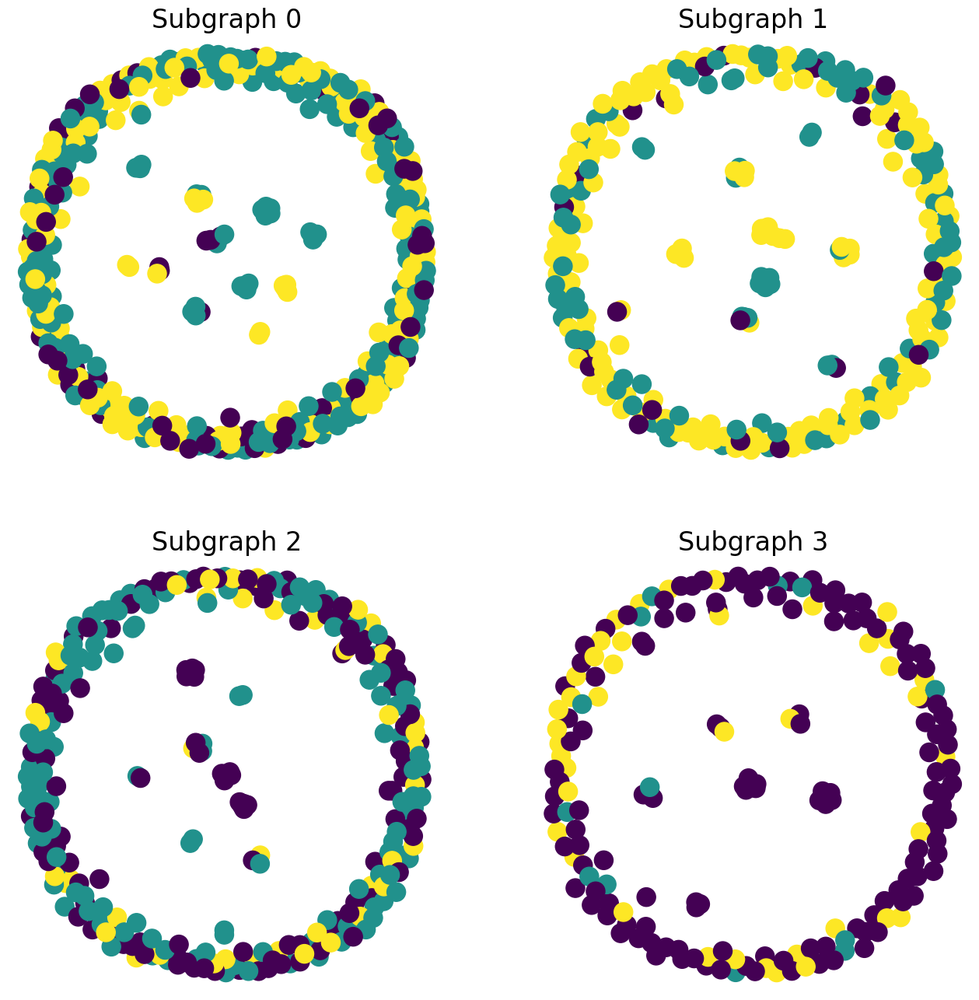

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Plot each subgraph
fig = plt.figure(figsize=(16,16))
for idx, (subdata, pos) in enumerate(zip(train_loader, [221, 222, 223, 224])):
    G = to_networkx(subdata, to_undirected=True)
    ax = fig.add_subplot(pos)
    ax.set_title(f'Subgraph {idx}', fontsize=24)
    plt.axis('off')
    nx.draw_networkx(G,
                    pos=nx.spring_layout(G, seed=0),
                    with_labels=False,
                    node_color=subdata.y,
                    )
plt.show()

In [ ]:
import torch
torch.manual_seed(-1)
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv


def accuracy(pred_y, y):
    """Calculate accuracy."""
    return ((pred_y == y).sum() / len(y)).item()


class GraphSAGE(torch.nn.Module):
    """GraphSAGE"""
    def __init__(self, dim_in, dim_h, dim_out):
        super().__init__()
        self.sage1 = SAGEConv(dim_in, dim_h)
        self.sage2 = SAGEConv(dim_h, dim_out)

    def forward(self, x, edge_index):
        h = self.sage1(x, edge_index)
        h = torch.relu(h)
        h = F.dropout(h, p=0.5, training=self.training)
        h = self.sage2(h, edge_index)
        return h

    def fit(self, loader, epochs):
        criterion = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr=0.01)

        self.train()
        for epoch in range(epochs+1):
            total_loss = 0
            acc = 0
            val_loss = 0
            val_acc = 0

            # Train on batches
            for batch in loader:
                optimizer.zero_grad()
                out = self(batch.x, batch.edge_index)
                loss = criterion(out[batch.train_mask], batch.y[batch.train_mask])
                total_loss += loss.item()
                acc += accuracy(out[batch.train_mask].argmax(dim=1), batch.y[batch.train_mask])
                loss.backward()
                optimizer.step()

                # Validation
                val_loss += criterion(out[batch.val_mask], batch.y[batch.val_mask])
                val_acc += accuracy(out[batch.val_mask].argmax(dim=1), batch.y[batch.val_mask])

            # Print metrics every 10 epochs
            if epoch % 20 == 0:
                print(f'Epoch {epoch:>3} | Train Loss: {loss/len(loader):.3f} | Train Acc: {acc/len(loader)*100:>6.2f}% | Val Loss: {val_loss/len(train_loader):.2f} | Val Acc: {val_acc/len(train_loader)*100:.2f}%')

    @torch.no_grad()
    def test(self, data):
        self.eval()
        out = self(data.x, data.edge_index)
        acc = accuracy(out.argmax(dim=1)[data.test_mask], data.y[data.test_mask])
        return acc

In [ ]:
# Create GraphSAGE
graphsage = GraphSAGE(dataset.num_features, 64, dataset.num_classes)
print(graphsage)

# Train
graphsage.fit(train_loader, 200)

# Test
acc = graphsage.test(data)
print(f'GraphSAGE test accuracy: {acc*100:.2f}%')

GraphSAGE(
  (sage1): SAGEConv(500, 64, aggr=mean)
  (sage2): SAGEConv(64, 3, aggr=mean)
)
Epoch   0 | Train Loss: 0.314 | Train Acc:  28.77% | Val Loss: 1.12 | Val Acc: 24.94%
Epoch  20 | Train Loss: 0.002 | Train Acc: 100.00% | Val Loss: 0.67 | Val Acc: 66.43%
Epoch  40 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.52 | Val Acc: 84.72%
Epoch  60 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.64 | Val Acc: 75.13%
Epoch  80 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.45 | Val Acc: 83.33%
Epoch 100 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.47 | Val Acc: 83.02%
Epoch 120 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.50 | Val Acc: 80.35%
Epoch 140 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.44 | Val Acc: 77.43%
Epoch 160 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.62 | Val Acc: 78.22%
Epoch 180 | Train Loss: 0.000 | Train Acc: 100.00% | Val Loss: 0.33 | Val Acc: 84.15%
Epoch 200 | Train Loss: 0.000 | Train Acc: 100.00

αρα, επαληθευεται ο προηγουμενος ισχυρισμος, οτι για μικροτερα γραφηματα με μικροτερο αριθμο μασκων, το accuracy του GraphSAGE μειωνεται (οντας ωστοσο ακομα σε αρκετα αξιοπρεπη επιπεδα accuracy της ταξης του 70 %).

Αρα, το GraphSAGE δουλευει καλυτερα για μεγαλα γραφηματα και για μεγαλο αριθμο μασκων

------------------------------------------------------------

------------------------------------------------------------